#import necessary libraries

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact,interactive
import ipywidgets as widgets
import random as rng
import imutils

In [ ]:
!git clone https://github.com/jkminder/jigsaw-puzzle-solver.git

Cloning into 'jigsaw-puzzle-solver'...
remote: Enumerating objects: 58, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 58 (delta 22), reused 58 (delta 22), pack-reused 0
Unpacking objects: 100% (58/58), 8.28 MiB | 5.36 MiB/s, done.


# Preprocess

In [ ]:
inputImage = cv2.imread('/content/jigsaw-puzzle-solver/samples/chien_rouge_20_1.jpg')

In [ ]:
#Resize Image
resize_ratio = 0.25

width = int(inputImage.shape[1] * resize_ratio)
height = int(inputImage.shape[0] * resize_ratio)
dim = (width, height)

inputImage = cv2.resize(inputImage, dim, interpolation = cv2.INTER_AREA)
print(inputImage.shape)

(1008, 567, 3)


In [ ]:
def remove_background(image_bgr):

  image_rgb = cv2.cvtColor(image_bgr.copy(), cv2.COLOR_BGR2RGB)
  image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV) # Convert the image to HSV color space

  hue_hist, bins = np.histogram(image_hsv[:, :, 0], bins=180, range=[0, 180])  # Calculate the color histogram in the hue channel
  dominant_hue = np.argmax(hue_hist) # Find the dominant hue value

  # Define the range for the dominant color in HSV color space
  lower_range = np.array([dominant_hue - 10, 50, 50], dtype=np.uint8)
  upper_range = np.array([dominant_hue + 10, 255, 255], dtype=np.uint8)

  # Create a mask to extract the dominant color range from the image
  mask = cv2.inRange(image_hsv, lower_range, upper_range)
  mask = cv2.medianBlur(mask,3)
  # plt.figure(figsize=(10,10))
  # plt.imshow(mask)
  # plt.axis('off')
  # plt.show()

  # Apply the mask to the original RGB image
  result = cv2.bitwise_and(image_rgb, image_rgb, mask=~mask)

  # Display the dominant color image
  plt.figure(figsize=(10,10))
  plt.imshow(result)
  plt.axis('off')
  plt.show()
  print("Done.....")

  return result,~mask

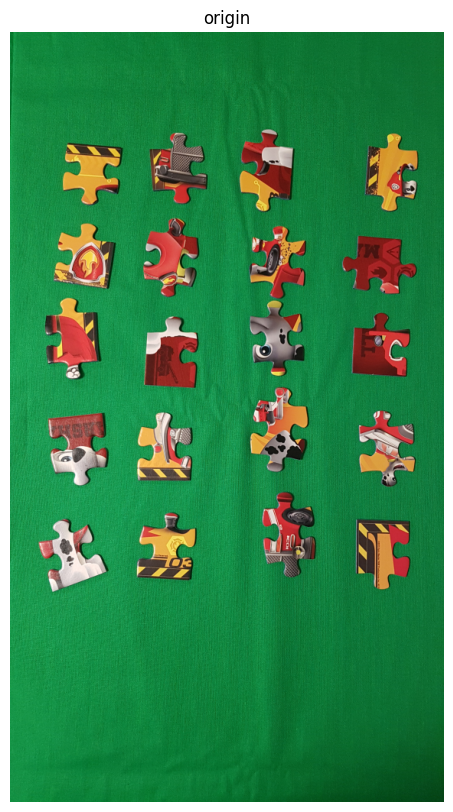

Image size: (1008, 567, 3)
Removing background.....


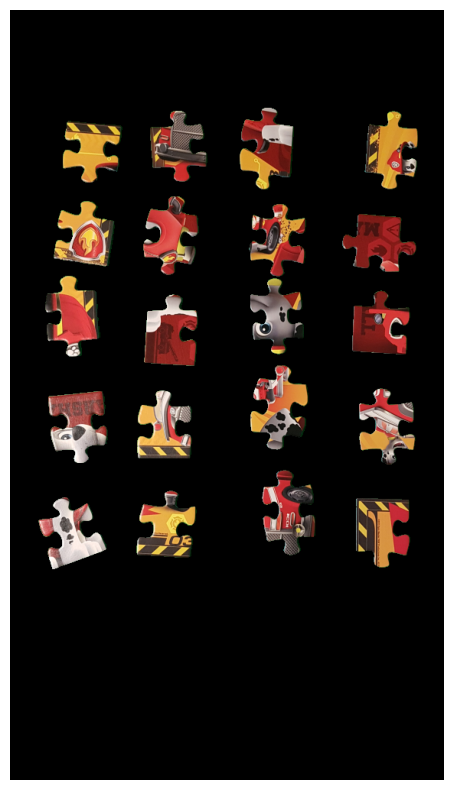

Done.....


In [ ]:
figure = plt.figure(figsize = (10,10))
plt.title('origin')
plt.imshow(inputImage[:,:,::-1])
plt.axis('off')
plt.show()
print('=============================')
print("Image size:",inputImage.shape)  
print('=============================')
print("Removing background.....")

origin_img,background_mask = remove_background(inputImage)

Total Jigsaw: 20


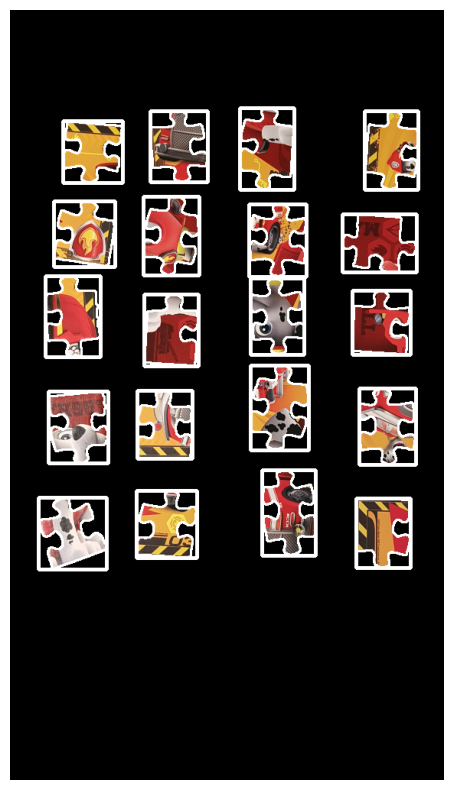

In [ ]:
def find_contours(origin_img,background_mask,verbose = True):
  contours, _ = cv2.findContours(background_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contourImage = origin_img.copy()
  for contourIdx in range(len(contours)):
      color = (255,255,255)
      # Calculates the bounding rectangle of a contour
      x, y, w, h = cv2.boundingRect(contours[contourIdx])
      cv2.drawContours(contourImage, contours, contourIdx, color, 2) #
      cv2.rectangle(contourImage,(x,y),(x+w,y+h),color,3) #box around cell
  if verbose:
    print('Total Jigsaw:',len(contours))
    plt.figure(figsize=(10,10))
    plt.imshow(contourImage)
    plt.axis('off')
    plt.show()
  return contours

contours = find_contours(origin_img,background_mask)

In [ ]:
def distance(p1, p2):
  return ((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)**0.5

In [ ]:
def findCorners(pts):
  min_sd = 10**9
  corners = np.array([])
  for pt1 in range(len(pts)-3):
    for pt2 in range(pt1+1, len(pts)-2):
      for pt3 in range(pt2+1, len(pts)-1):
        for pt4 in range(pt3+1, len(pts)):
          d1 = distance(pts[pt1], pts[pt2])
          d2 = distance(pts[pt2], pts[pt3])
          d3 = distance(pts[pt3], pts[pt4])
          d4 = distance(pts[pt4], pts[pt1])
          corn = np.array([pts[pt1],pts[pt2],pts[pt3],pts[pt4]])
          sd = np.std(np.array([d1,d2,d3,d4]))
          if sd < min_sd:
            corners = corn
            min_sd = sd
  return corners

In [ ]:
def sort_points(points):
    sorted_points = np.zeros(points.shape)
    # Sort each pair of points individually
    for i,point in enumerate(points):
        x = point[:, 0]
        # Sort the points based on the x-coordinate
        sort_indices = np.argsort(x)
        sorted_points[i] = point[sort_indices]  

    # print(sorted_points)
    
    # Extract the x-coordinate of the first point in each pair
    x = sorted_points[:, 0, 0]

    # Extract the y-coordinate of the first point in each pair
    y = sorted_points[:, 0, 1]

    # Sort the points based on the x-coordinate and then the y-coordinate
    sort_indices = np.lexsort((y, x))

    return sorted_points[sort_indices]

In [ ]:
def sort_corner(pts):
  a = [x+y for x,y in pts]
  idx = np.array(a).argmin()
  return np.concatenate([pts[idx:], pts[:idx]])

In [ ]:
font = cv2.FONT_HERSHEY_SIMPLEX
org = (50, 50) # org
fontScale = 1 # fontScale
color = (255, 0, 0) # Blue color in BGR
thickness = 2 # Line thickness of 2 px

In [ ]:
class JigsawLoader:
    def __init__(self,verbose=False):

        self.verbose = verbose
        
    def find_contour(self,origin_img,mask):
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contourImage = origin_img.copy()
        for contourIdx in range(len(contours)):
            color = (255,255,255)
            # Calculates the bounding rectangle of a contour
            x, y, w, h = cv2.boundingRect(contours[contourIdx])
            cv2.drawContours(contourImage, contours, contourIdx, color, 2) #
            cv2.rectangle(contourImage,(x,y),(x+w,y+h),color,3) #box around cell
        if self.verbose:
            print('Total Jigsaw:',len(contours))
            # plt.figure(figsize=(10,10))
            plt.imshow(contourImage)
            plt.axis('off')
            plt.show()
        return contours

    def crop_img(self,image_with_no_background,contour):
        x, y, w, h = cv2.boundingRect(contour)
        img = image_with_no_background.copy()[y:y+h, x:x+w]
        return cv2.copyMakeBorder(img, 30, 30, 30, 30, cv2.BORDER_CONSTANT)
    
    def find_corner(self,jigsaw_img,contour):
        # convex
        convexHullPoint = cv2.convexHull(contour)
        convexHullPoints = convexHullPoint.reshape(len(convexHullPoint), 2)

        # poly approx
        arc =  cv2.arcLength(convexHullPoint,True)
        eps = 0.01
        poly = cv2.approxPolyDP(convexHullPoint,eps*arc,True)
        poly = poly.reshape(len(poly), 2)

        # find corners
        pts = findCorners(poly)

        if self.verbose:
            print("corner:",pts)
            cornerImage = jigsaw_img.copy()
            for x, y in pts:
                cv2.circle(cornerImage, (x,y), 4, (60, 255, 255), -1)

            # figure = plt.figure(figsize=(10,10))
            plt.imshow(cornerImage)
            # plt.axis('off')
            plt.show()
          
        return pts


    def find_center(self,corner):
        x, y = corner.mean(axis=0)
        return (int(x), int(y))

    def find_locks(self,jigsaw_img,contour,corner_point):
        # count defects
        convexHull = cv2.convexHull(contour,returnPoints = False)
        convexityDefects = cv2.convexityDefects(contour, convexHull)
        pts = sort_corner(corner_point)
        defectPoint = []
        if self.verbose:
            result_img = jigsaw_img.copy()

        for i in convexityDefects:
            x0,x1,y,dist = i[0]
            if dist > 1000:
                defectPoint.append(contour[y][0])
        
        tmp = np.concatenate((pts,[pts[0]]), axis=0)
        edges = np.array([[tmp[i], tmp[i+1]] for i in range(len(pts))])
        # edges = sort_points(edges)
        count_defect = [0]*4

        for pt in defectPoint:
            # find closet edge
            d_min = 10**9
            edge = -1
            for idx, [p1, p2] in enumerate(edges):
                # distance between point and edge
                # print(p1,p2)
                d=np.cross(p2-p1,pt-p1)/np.linalg.norm(p2-p1)
                d = abs(d)
                if d < d_min:
                    d_min = d
                    edge = idx
            count_defect[edge] += 1

        # print(count_defect)

        locks = []
        for idx, [p1, p2] in enumerate(edges):
            midx = int((p1[0]+p2[0])/2)
            midy = int((p1[1]+p2[1])/2)
            lock = 'flat'
            if count_defect[idx] == 1:
                lock = 'inner'
            elif count_defect[idx] == 2:
                lock = 'outer'
            locks.append(lock)
            if self.verbose:
                result_img = cv2.putText(result_img, lock, (midx-20,midy), 3, 0.5, (90, 255, 255), thickness, cv2.LINE_AA)
        
        if self.verbose:
            # figure = plt.figure(figsize=(10,10))
            plt.imshow(result_img)
            plt.axis('off')
            plt.show()

        return locks

    def aligner(self,jigsaw,jigsaw_image):
        j = jigsaw
        if self.verbose:
          result = jigsaw_image.copy()
          result = cv2.circle(result, (j.x,j.y), 3, (0, 255, 0), -1)

        b = np.array([j.x, j.y])
        a = np.array([(j.corners[0][0]+j.corners[1][0])//2, (j.corners[0][1]+j.corners[1][1])//2])
        c = np.array([j.x, j.y-30])
        # print(b, a)
        ba = a - b
        bc = c - b
        # print(a, b, c)
        cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
        angle = np.arccos(cosine_angle)
        angle = np.degrees(angle)%90
        # print(angle)
        if self.verbose:
            result = cv2.circle(result, (a[0],a[1]), 3, (0, 255, 0), -1)
            result = cv2.circle(result, (c[0],c[1]), 3, (0, 255, 0), -1)
            plt.imshow(result)
            plt.axis('off')
            plt.show()

            rotated = imutils.rotate_bound(result, -angle)
            plt.imshow(rotated)
            plt.axis('off')
            plt.show()

        result = jigsaw_image.copy() 
        rotated = imutils.rotate_bound(result, -angle)

        return rotated,angle
    def compute_matrix(self,center,corner,contour):
      #Finding point in outer and inner to create matching area
      return None


In [ ]:
class Jigsaw:
    def __init__(self,
                 label,
                 center,
                 corners,
                 image = None,
                 contour = None,
                 matrix = None,
                 ):
      
      self.label = label
      self.x = center[0]
      self.y = center[1]
      self.corners = corners
      self.image = image
      self.contour = contour
      self.matrix = matrix

    def classifier(self):
        if self.label.count('flat') == 1:
          return 'edge'
        elif self.label.count('flat') == 2:
          return 'corner'
        return 'inner'
    
    def show_image(self):
        plt.imshow(self.image)
        plt.show()


# Create jigsaw object

In [ ]:
def init_jigsaw_list(origin_img,contours):
  JL = JigsawLoader(verbose = False)
  puzzle = []
  for cnt in contours:
      pieces = []

      jigsaw_img = JL.crop_img(origin_img,cnt)
      # plt.imshow(jigsaw_img)
      # plt.axis('off')
      # plt.show()
      contour = JL.find_contour(jigsaw_img,cv2.cvtColor(jigsaw_img,cv2.COLOR_RGB2GRAY))[0]

      corners = JL.find_corner(jigsaw_img,contour) # top-right bottom-right bottom-left top-left
      # print(corners)
      center = JL.find_center(corners) 
      label = JL.find_locks(jigsaw_img,contour,corners)

      jigsaw = Jigsaw(label,center,corners)
      result,angle = JL.aligner(jigsaw,jigsaw_img)

      # plt.imshow(result)
      # plt.axis('off')
      # plt.show()

      # print(label)
      # print('----------------------------------------------------')
      
      for i in range(4):
          print(f'({len(puzzle)},{i})')
          contour = JL.find_contour(result,cv2.cvtColor(result,cv2.COLOR_RGB2GRAY))[0]
          corners = JL.find_corner(result,contour)
          corners = sort_corner(corners)
          # print(corner)
          center = JL.find_center(corners) 
          label = JL.find_locks(result,contour,corners)
          label = label[3:]+label[:3]
          matrix = JL.compute_matrix(center,corners,contour)
          # print(corners)
          jigsaw = Jigsaw(label,center,corners,result,contour,matrix)
          
          # plt.imshow(result)
          # plt.axis('off')
          # plt.show()

          print(label)
          print('----------------------------------------------------')
          result = imutils.rotate_bound(result, -90)
          pieces.append(jigsaw)
      
      puzzle.append(pieces)

  return puzzle

(0,0)


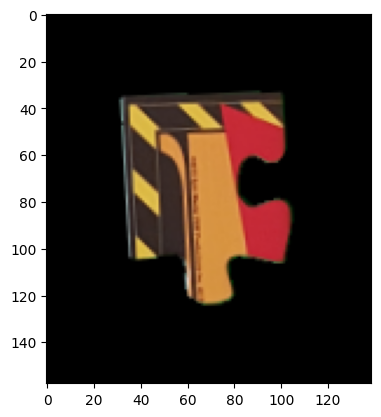

['flat', 'flat', 'inner', 'outer']
----------------------------------------------------
(0,1)


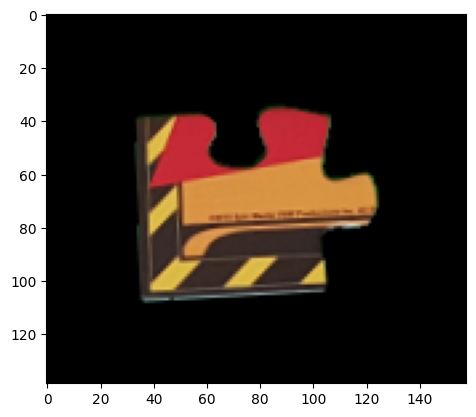

['flat', 'inner', 'outer', 'flat']
----------------------------------------------------
(0,2)


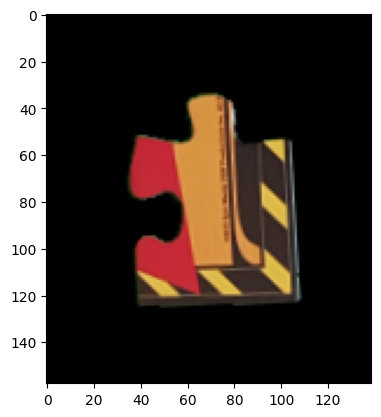

['inner', 'outer', 'flat', 'flat']
----------------------------------------------------
(0,3)


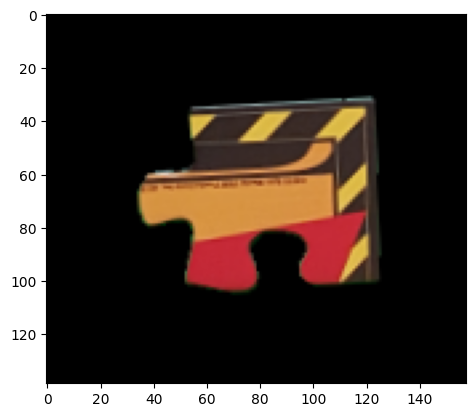

['outer', 'flat', 'flat', 'inner']
----------------------------------------------------
(1,0)


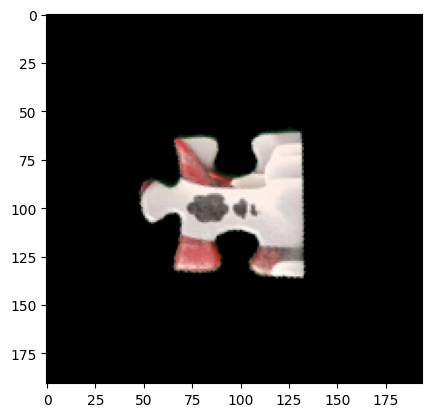

['outer', 'inner', 'flat', 'inner']
----------------------------------------------------
(1,1)


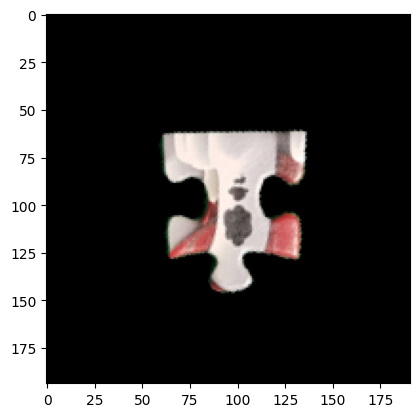

['inner', 'flat', 'inner', 'outer']
----------------------------------------------------
(1,2)


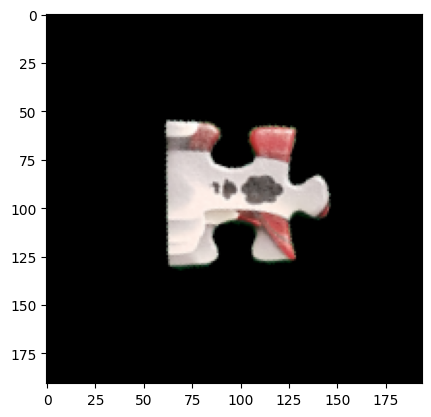

['flat', 'inner', 'outer', 'inner']
----------------------------------------------------
(1,3)


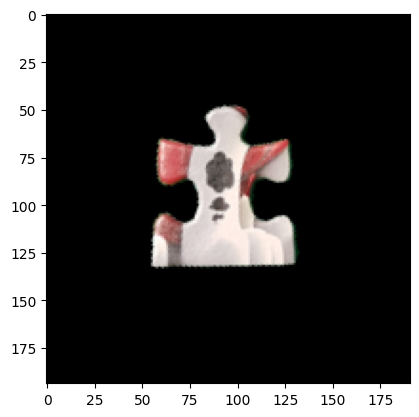

['inner', 'outer', 'inner', 'flat']
----------------------------------------------------
(2,0)


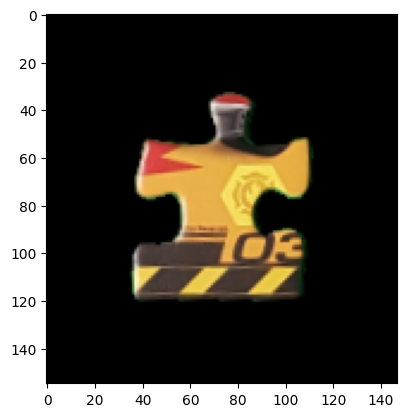

['inner', 'outer', 'inner', 'flat']
----------------------------------------------------
(2,1)


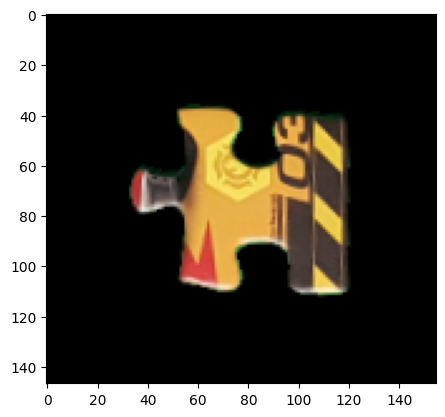

['outer', 'inner', 'flat', 'inner']
----------------------------------------------------
(2,2)


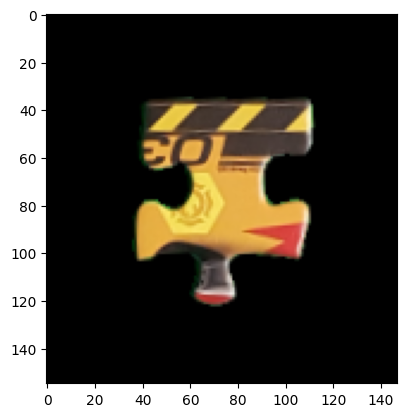

['inner', 'flat', 'inner', 'outer']
----------------------------------------------------
(2,3)


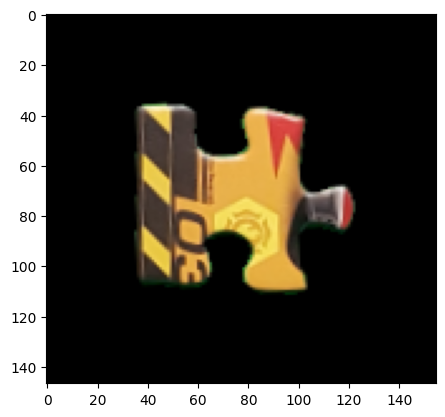

['flat', 'inner', 'outer', 'inner']
----------------------------------------------------
(3,0)


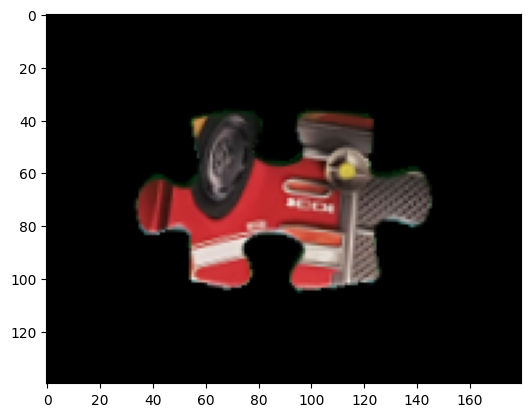

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(3,1)


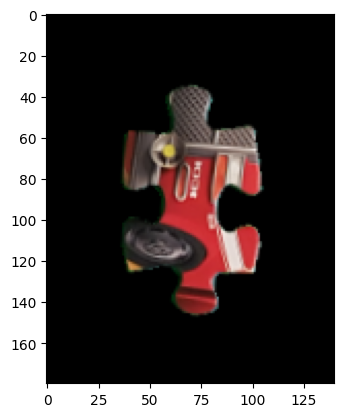

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(3,2)


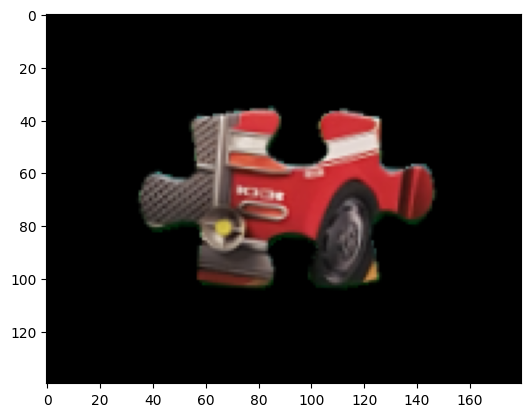

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(3,3)


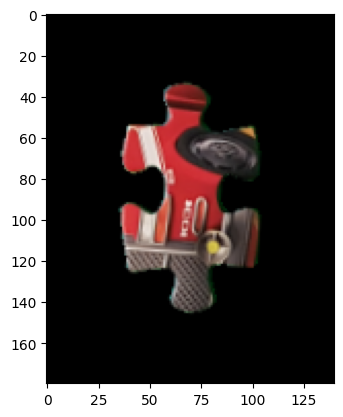

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(4,0)


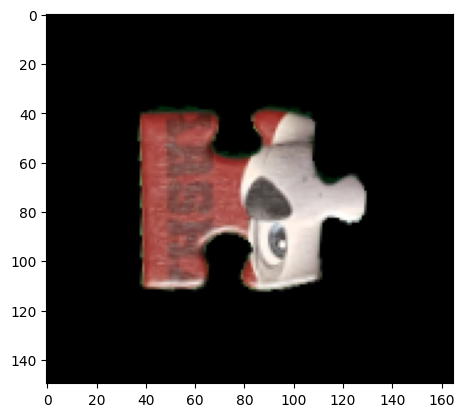

['flat', 'inner', 'outer', 'inner']
----------------------------------------------------
(4,1)


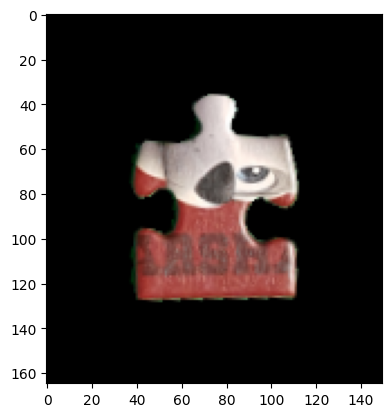

['inner', 'outer', 'inner', 'flat']
----------------------------------------------------
(4,2)


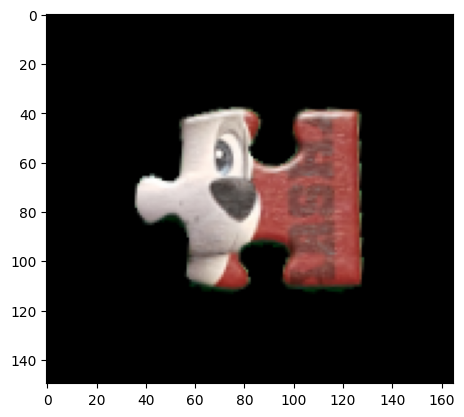

['outer', 'inner', 'flat', 'inner']
----------------------------------------------------
(4,3)


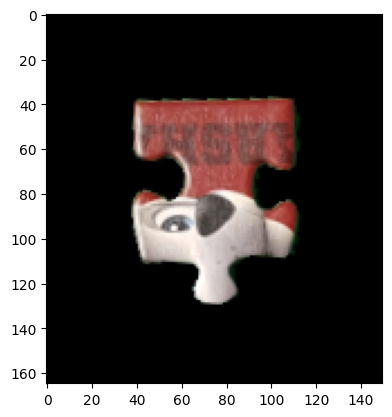

['inner', 'flat', 'inner', 'outer']
----------------------------------------------------
(5,0)


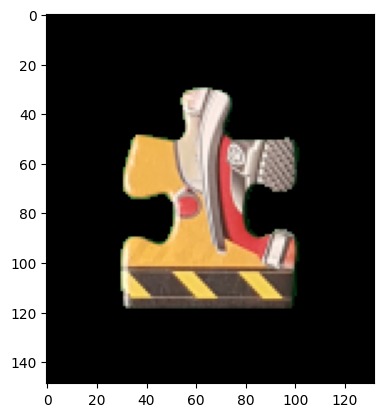

['inner', 'outer', 'inner', 'flat']
----------------------------------------------------
(5,1)


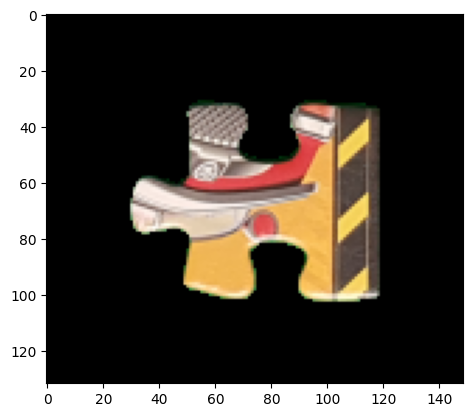

['outer', 'inner', 'flat', 'inner']
----------------------------------------------------
(5,2)


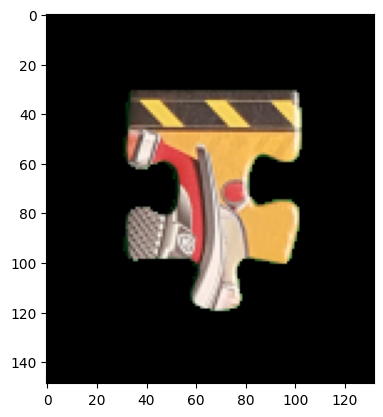

['inner', 'flat', 'inner', 'outer']
----------------------------------------------------
(5,3)


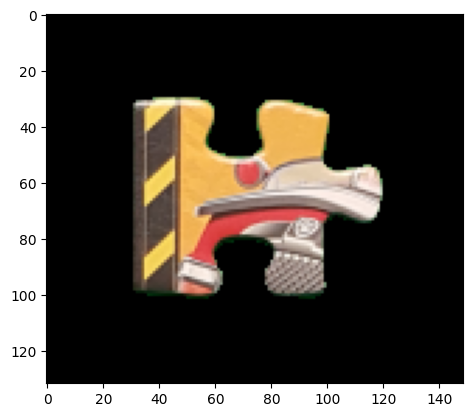

['flat', 'inner', 'outer', 'inner']
----------------------------------------------------
(6,0)


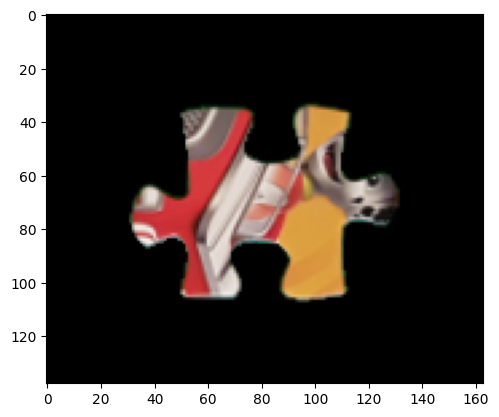

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(6,1)


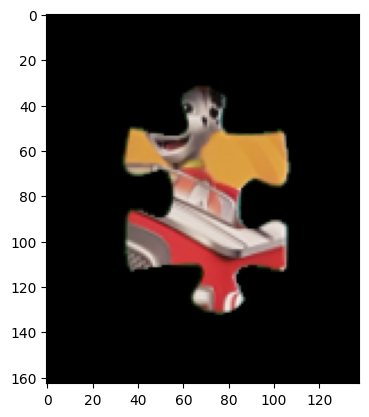

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(6,2)


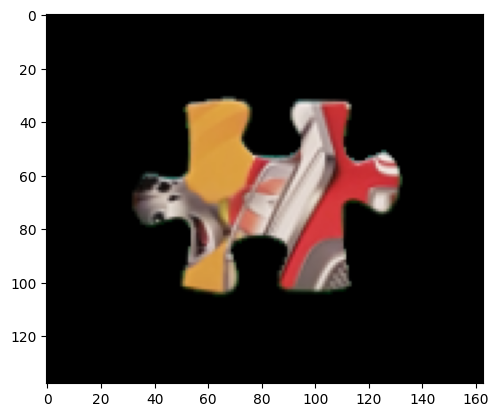

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(6,3)


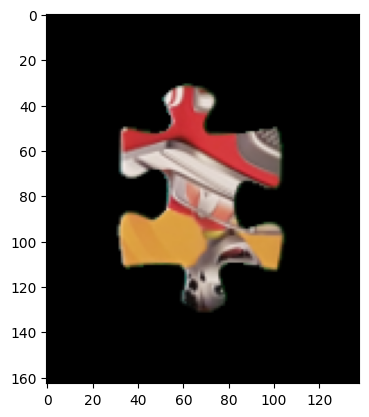

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(7,0)


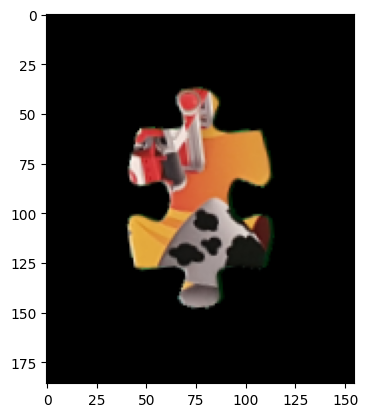

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(7,1)


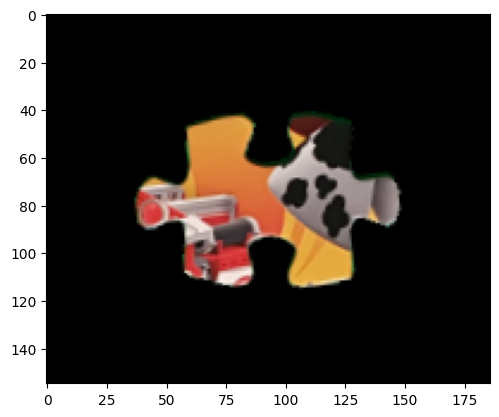

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(7,2)


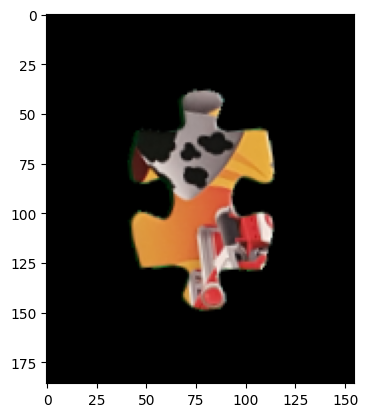

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(7,3)


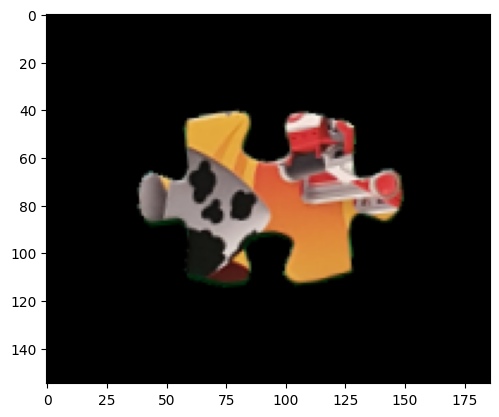

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(8,0)


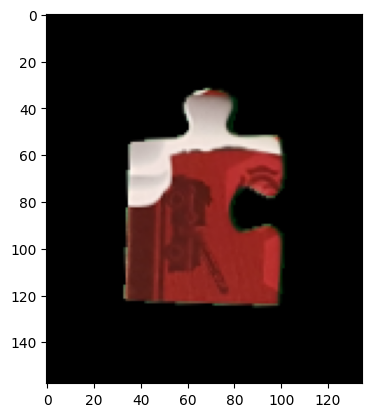

['flat', 'outer', 'inner', 'flat']
----------------------------------------------------
(8,1)


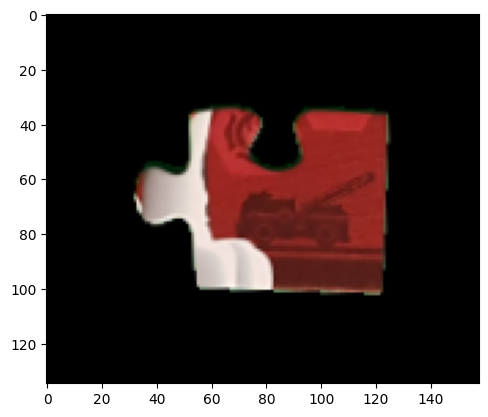

['outer', 'inner', 'flat', 'flat']
----------------------------------------------------
(8,2)


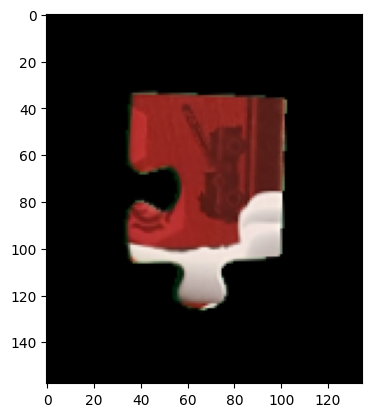

['inner', 'flat', 'flat', 'outer']
----------------------------------------------------
(8,3)


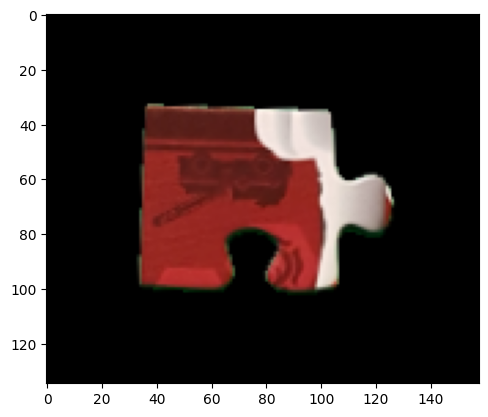

['flat', 'flat', 'outer', 'inner']
----------------------------------------------------
(9,0)


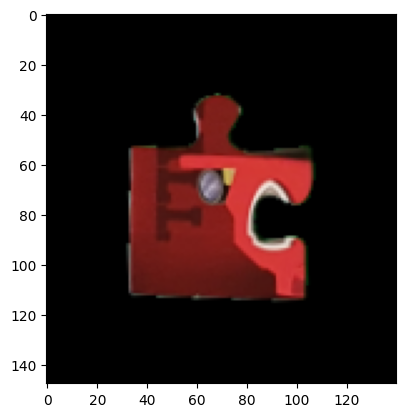

['flat', 'outer', 'inner', 'flat']
----------------------------------------------------
(9,1)


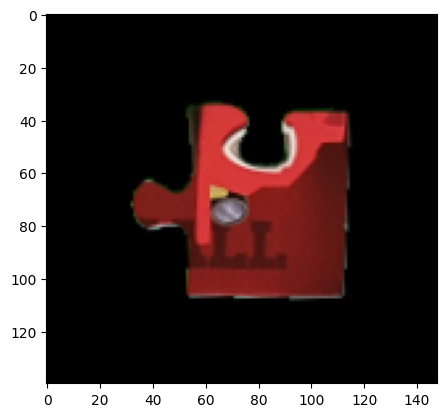

['outer', 'inner', 'flat', 'flat']
----------------------------------------------------
(9,2)


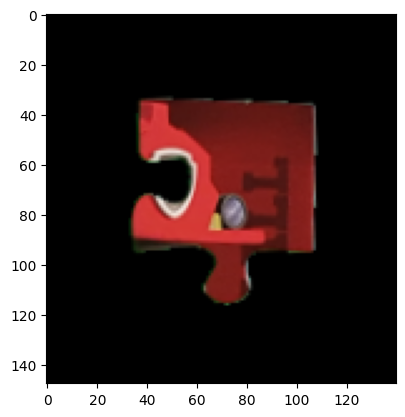

['inner', 'flat', 'flat', 'outer']
----------------------------------------------------
(9,3)


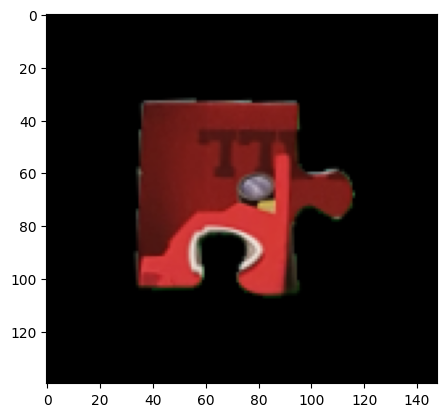

['flat', 'flat', 'outer', 'inner']
----------------------------------------------------
(10,0)


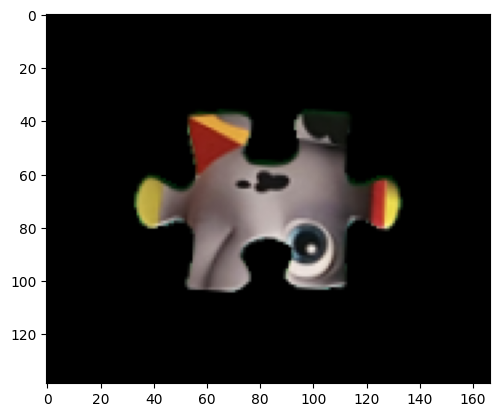

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(10,1)


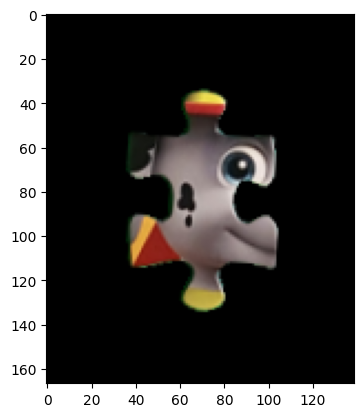

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(10,2)


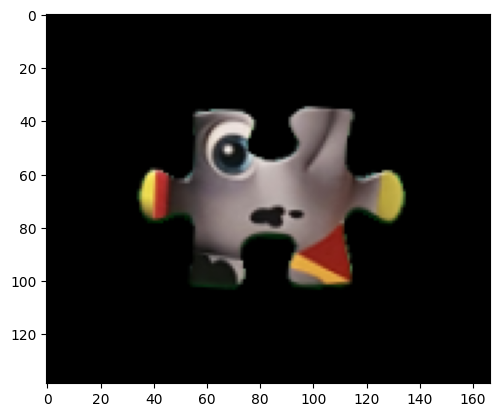

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(10,3)


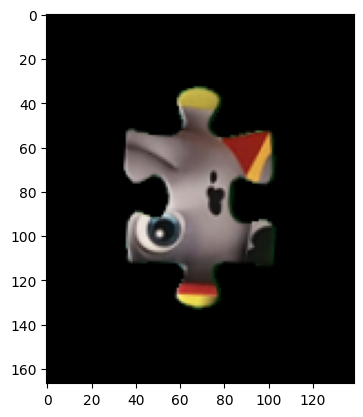

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(11,0)


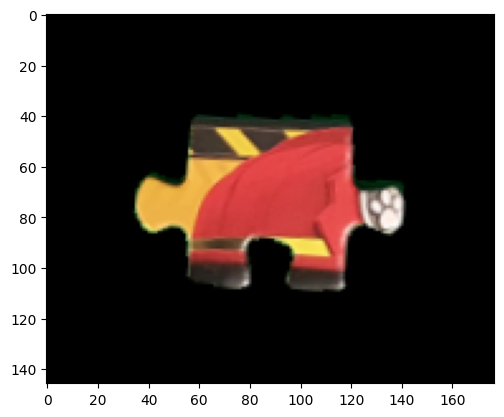

['outer', 'flat', 'outer', 'inner']
----------------------------------------------------
(11,1)


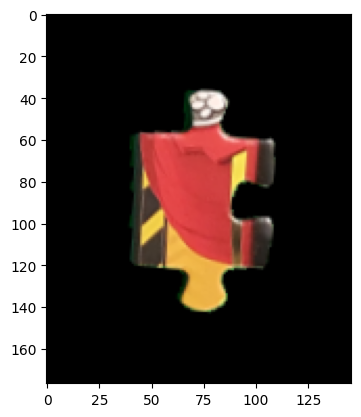

['flat', 'outer', 'inner', 'outer']
----------------------------------------------------
(11,2)


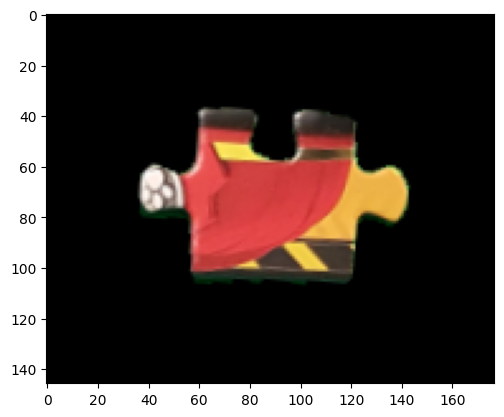

['outer', 'inner', 'outer', 'flat']
----------------------------------------------------
(11,3)


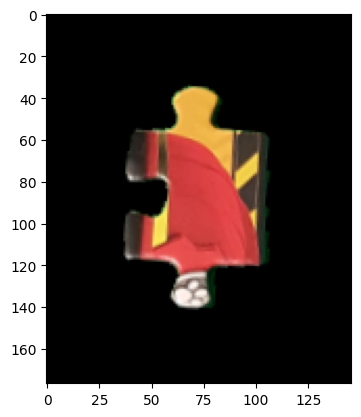

['inner', 'outer', 'flat', 'outer']
----------------------------------------------------
(12,0)


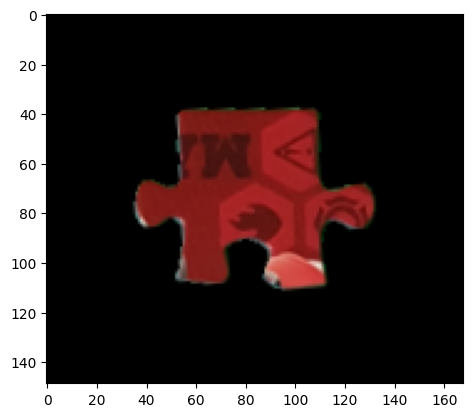

['outer', 'flat', 'outer', 'inner']
----------------------------------------------------
(12,1)


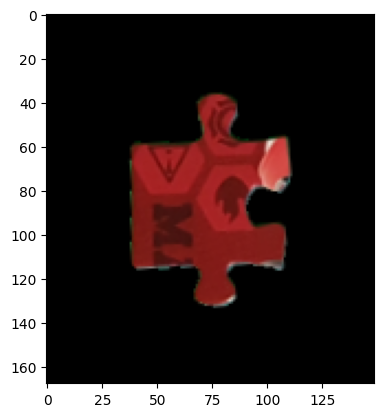

['flat', 'outer', 'inner', 'outer']
----------------------------------------------------
(12,2)


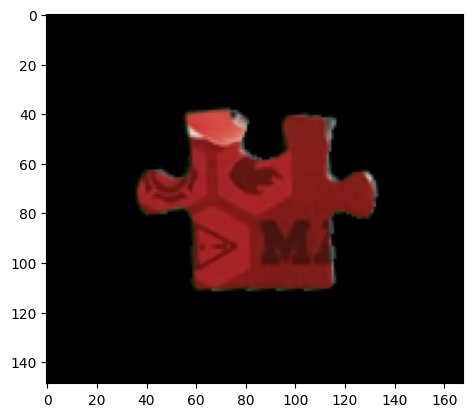

['outer', 'inner', 'outer', 'flat']
----------------------------------------------------
(12,3)


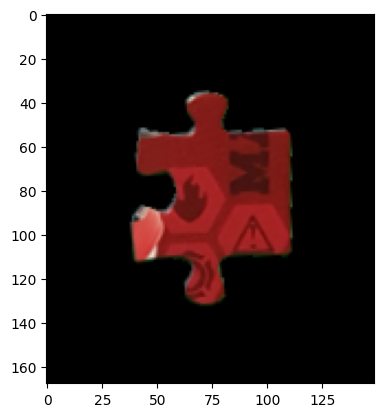

['inner', 'outer', 'flat', 'outer']
----------------------------------------------------
(13,0)


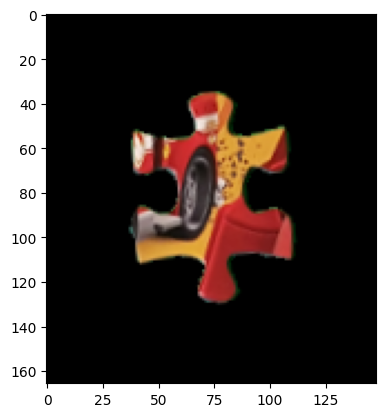

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(13,1)


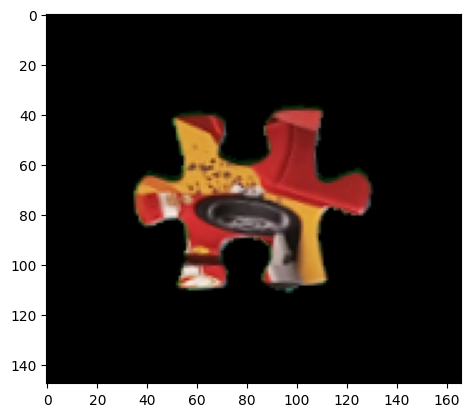

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(13,2)


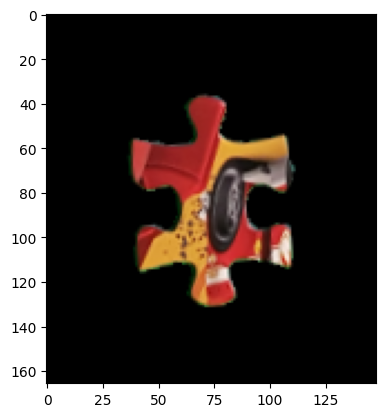

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(13,3)


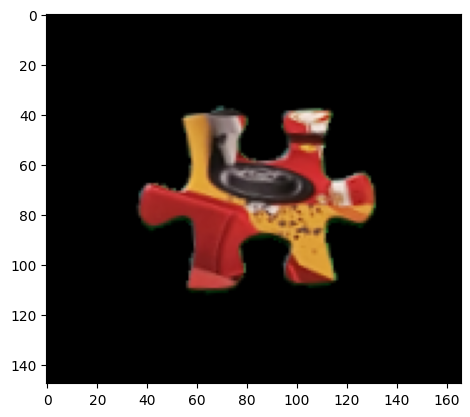

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(14,0)


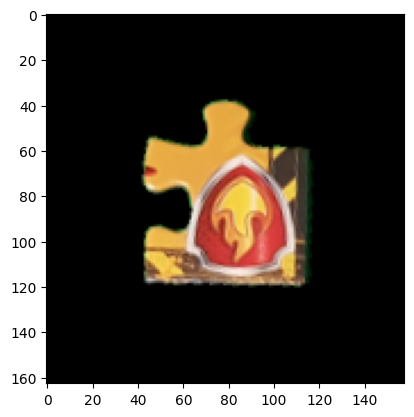

['inner', 'outer', 'flat', 'flat']
----------------------------------------------------
(14,1)


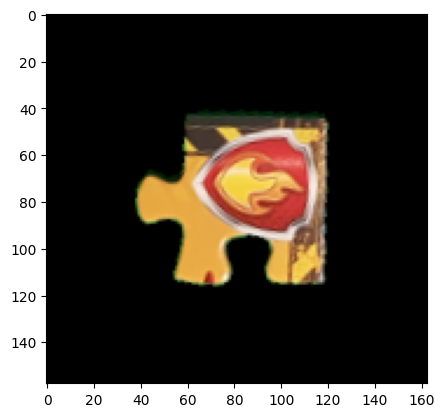

['outer', 'flat', 'flat', 'inner']
----------------------------------------------------
(14,2)


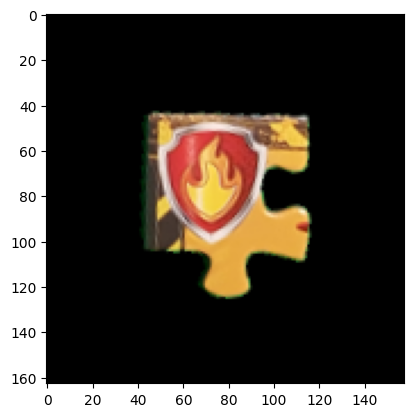

['flat', 'flat', 'inner', 'outer']
----------------------------------------------------
(14,3)


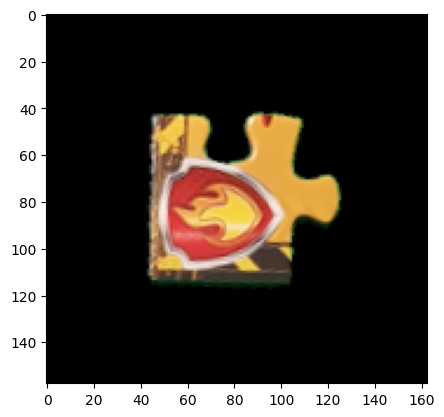

['flat', 'inner', 'outer', 'flat']
----------------------------------------------------
(15,0)


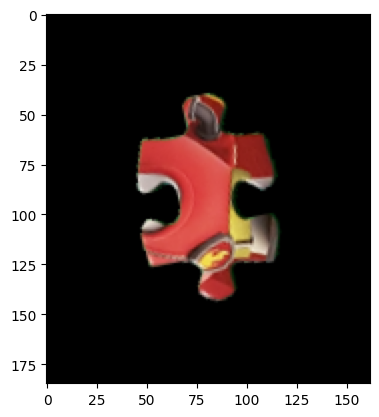

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(15,1)


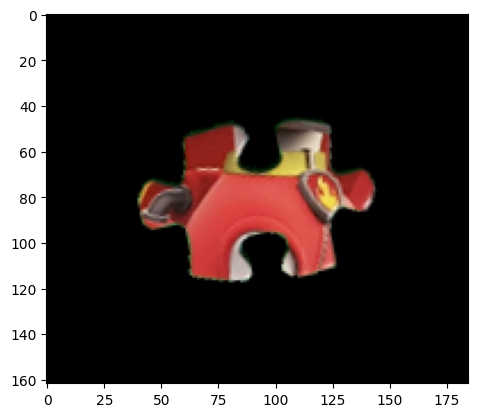

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(15,2)


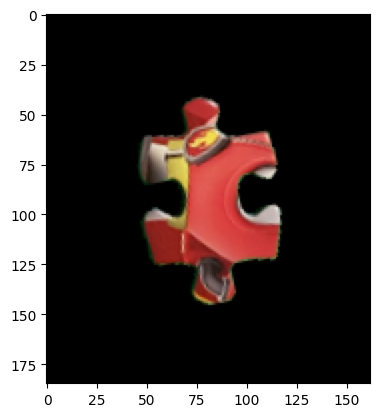

['inner', 'outer', 'inner', 'outer']
----------------------------------------------------
(15,3)


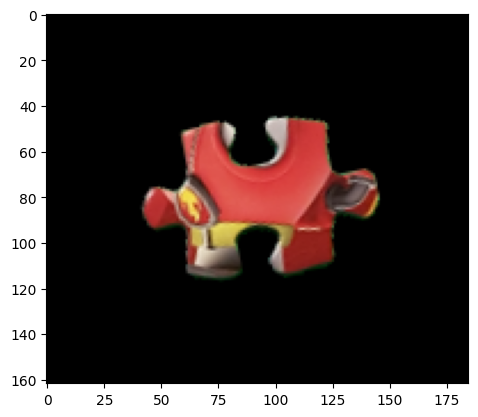

['outer', 'inner', 'outer', 'inner']
----------------------------------------------------
(16,0)


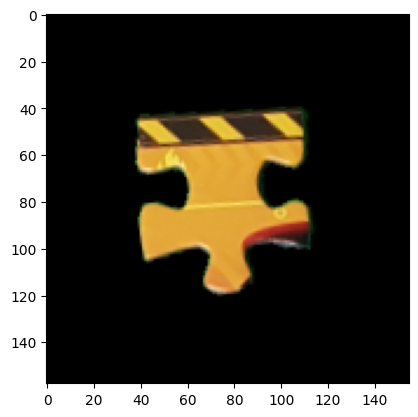

['inner', 'flat', 'inner', 'outer']
----------------------------------------------------
(16,1)


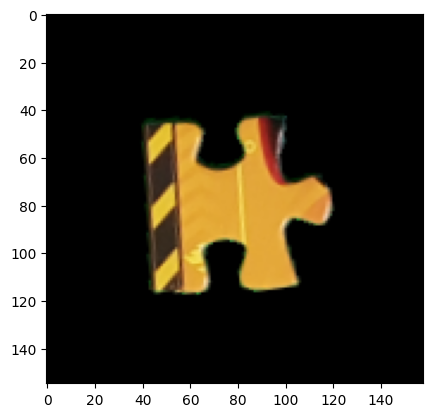

['flat', 'inner', 'outer', 'inner']
----------------------------------------------------
(16,2)


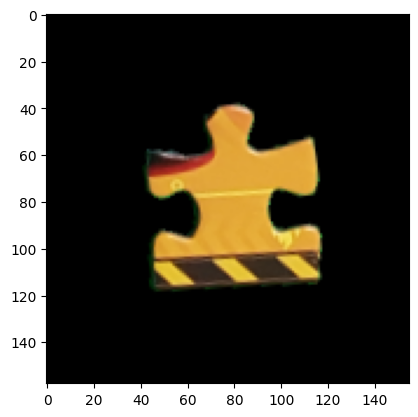

['inner', 'outer', 'inner', 'flat']
----------------------------------------------------
(16,3)


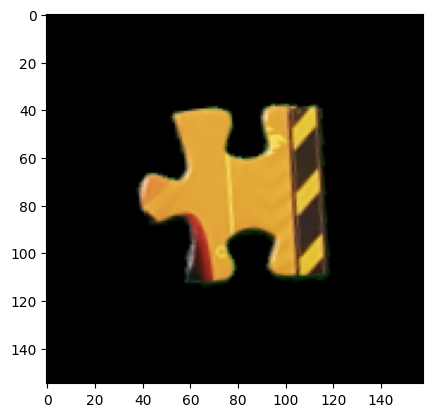

['outer', 'inner', 'flat', 'inner']
----------------------------------------------------
(17,0)


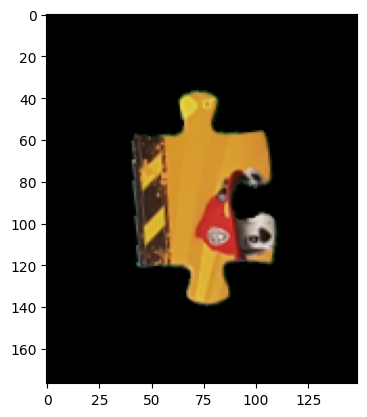

['flat', 'outer', 'inner', 'outer']
----------------------------------------------------
(17,1)


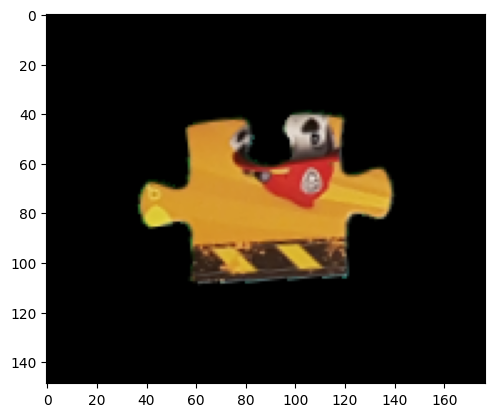

['outer', 'inner', 'outer', 'flat']
----------------------------------------------------
(17,2)


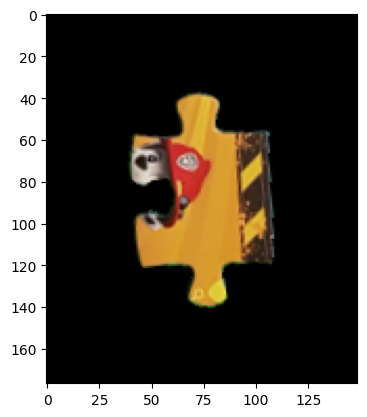

['inner', 'outer', 'flat', 'outer']
----------------------------------------------------
(17,3)


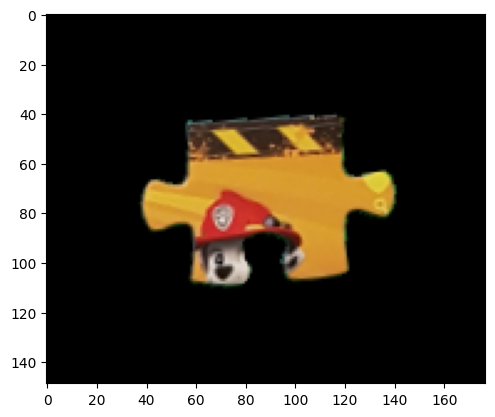

['outer', 'flat', 'outer', 'inner']
----------------------------------------------------
(18,0)


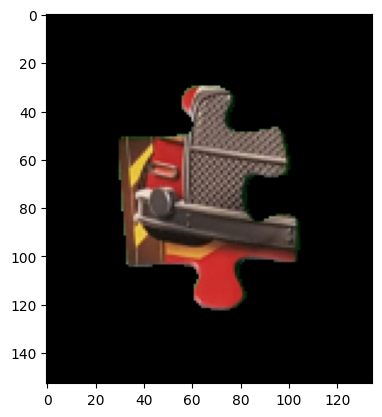

['flat', 'outer', 'inner', 'outer']
----------------------------------------------------
(18,1)


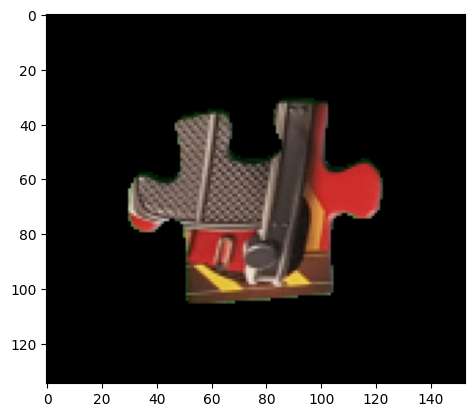

['outer', 'inner', 'outer', 'flat']
----------------------------------------------------
(18,2)


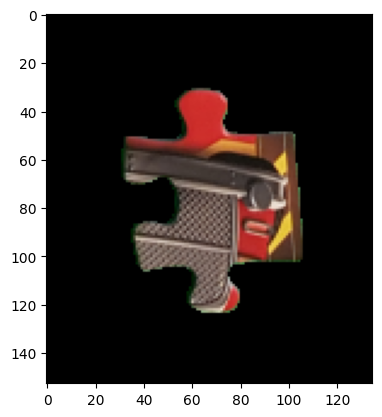

['inner', 'outer', 'flat', 'outer']
----------------------------------------------------
(18,3)


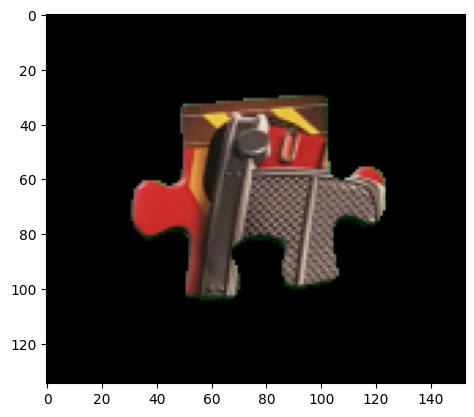

['outer', 'flat', 'outer', 'inner']
----------------------------------------------------
(19,0)


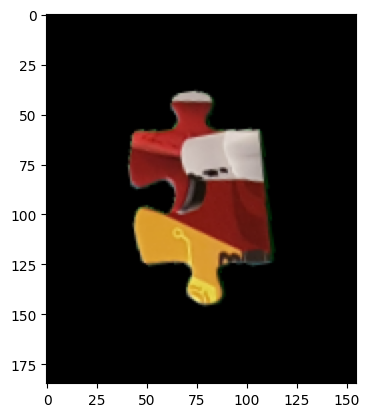

['inner', 'outer', 'flat', 'outer']
----------------------------------------------------
(19,1)


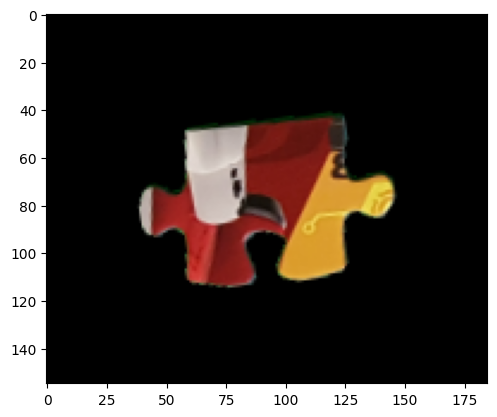

['outer', 'flat', 'outer', 'inner']
----------------------------------------------------
(19,2)


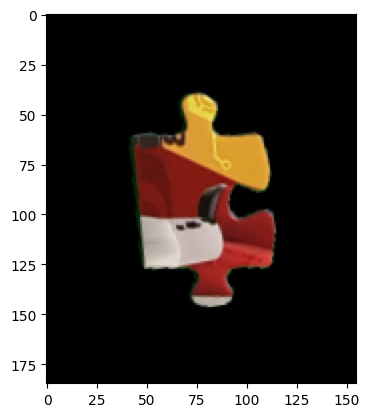

['flat', 'outer', 'inner', 'outer']
----------------------------------------------------
(19,3)


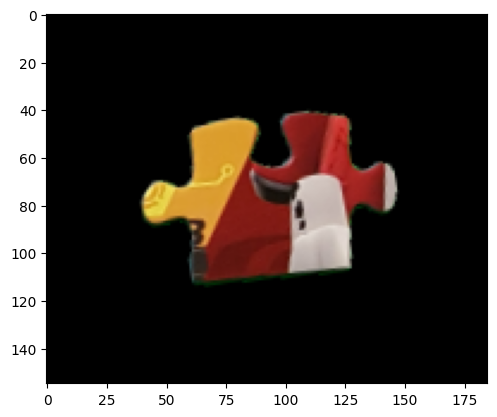

['outer', 'inner', 'outer', 'flat']
----------------------------------------------------


In [ ]:
jigsaw_pieces = init_jigsaw_list(origin_img,contours)

# Matching Score

## Shape

In [ ]:
def makeBorder(img1,img2):
  h1,w1,_ = img1.shape
  h2,w2,_ = img2.shape
  max_h = h1 if h1 > h2 else h2
  max_w = w1 if w1 > w2 else w2

  diff_h = abs(h1-h2)//2
  diff_w = abs(w1-w2)//2

  border_color = (0, 0, 0)
  if max_h == h2:
    img1 = cv2.copyMakeBorder(img1,diff_h,diff_h,0,0,cv2.BORDER_CONSTANT) 
    if abs(h1-h2)%2==1:
      img1 = cv2.copyMakeBorder(img1,1,0,0,0,cv2.BORDER_CONSTANT,value=border_color) 

  else:
    img2 = cv2.copyMakeBorder(img2,diff_h,diff_h,0,0,cv2.BORDER_CONSTANT) 
    if abs(h1-h2)%2==1:
      img2 = cv2.copyMakeBorder(img2,1,0,0,0,cv2.BORDER_CONSTANT,value=border_color) 

  if max_w == w2:
    img1 = cv2.copyMakeBorder(img1,0,0,diff_w,diff_w,cv2.BORDER_CONSTANT) 
    if abs(w1-w2)%2==1:
      img1 = cv2.copyMakeBorder(img1,0,0,1,0,cv2.BORDER_CONSTANT,value=border_color)
  else:
    img2 = cv2.copyMakeBorder(img2,0,0,diff_w,diff_w,cv2.BORDER_CONSTANT) 
    if abs(w1-w2)%2==1:
      img2 = cv2.copyMakeBorder(img2,0,0,1,0,cv2.BORDER_CONSTANT,value=border_color)
      
  return img1,img2

In [ ]:
def cal_coords(JL,image):
    contour = JL.find_contour(image,cv2.cvtColor(image,cv2.COLOR_RGB2GRAY))[0]
    corners = sort_corner(JL.find_corner(image,contour))
    center = JL.find_center(corners)
    return contour,corners,center

In [ ]:
def shape_match_score(candidate,ref): # assume side: 0=left, 1=bottom, 2=right, 3=top
    JL = JigsawLoader(verbose = False)
    ref_image = ref.image.copy()
    candi_image = candidate.image.copy()

    ref_image,candi_image = makeBorder(ref_image,candi_image)

    ref_contour,ref_corners,ref_center = cal_coords(JL,ref_image)
    ref_tr_x,ref_tr_y = ref_corners[1]
    ref_br_x,ref_br_y = ref_corners[2]
    extend_gap_for_candi = ref_tr_x - ref_center[0]

    candi_image = cv2.copyMakeBorder(candi_image,0,0,extend_gap_for_candi,0,cv2.BORDER_CONSTANT)

    candi_contour,candi_corners,candi_center = cal_coords(JL,candi_image)
    candi_tl_x,candi_tl_y = candi_corners[0]
    candi_bl_x,candi_bl_y = candi_corners[3]
    extend_gap_for_ref = candi_center[0] - candi_tl_x

    ref_image = cv2.copyMakeBorder(ref_image,0,0,0,extend_gap_for_ref,cv2.BORDER_CONSTANT)
    
    ref_side = ref_image[ref_tr_y:ref_br_y+1,ref_center[0]:ref_tr_x+extend_gap_for_ref]
    ref_side[:,0:10] = 255
    candi_side = candi_image[candi_tl_y:candi_bl_y+1,candi_tl_x-extend_gap_for_candi:candi_center[0]]
    candi_side[:,candi_side.shape[1]-10:candi_side.shape[1]] = 255

    max_h = ref_side.shape[0] if ref_side.shape[0]>candi_side.shape[0] else candi_side.shape[0]
    diff_h = abs(ref_side.shape[0]-candi_side.shape[0])

    value= (255,255,255)

    if max_h == ref_side.shape[0]:
      h = candi_side.shape[0]
      candi_side = cv2.copyMakeBorder(candi_side,0,diff_h,0,0,cv2.BORDER_CONSTANT,value=color)
      candi_side[h:candi_side.shape[0]+1,0:candi_bl_x - candi_center[0]+1] = 0

    else:
      h = ref_side.shape[0]
      ref_side = cv2.copyMakeBorder(ref_side,0,diff_h,0,0,cv2.BORDER_CONSTANT,value=color)
      ref_side[h:ref_side.shape[0]+1,ref_br_x - ref_center[0]:ref_side.shape[1]+1] = 0

    img1 = cv2.cvtColor(ref_side,cv2.COLOR_RGB2GRAY)
    img2 = cv2.cvtColor(candi_side,cv2.COLOR_RGB2GRAY)

    _, img1 = cv2.threshold(img1, 10, 155, cv2.THRESH_BINARY)
    _, img2 = cv2.threshold(img2, 10, 155, cv2.THRESH_BINARY)

    result = cv2.bitwise_xor(img1 ,img2)

    score = np.sum(result == 0)/(result.shape[0]*result.shape[1]) #as percentage

    return 1-score

## Color

In [ ]:
!pip -q install fastdtw

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
def mask_subcontour(subcontour,ori_img,black_img):
  thickness = 15
  mask_sub = cv2.polylines(black_img.copy(), [subcontour], False, (255,255,255),thickness)
  mask_sub = ori_img&mask_sub
  mask_sub = np.argwhere(mask_sub != [0, 0, 0])[0::3]

  return mask_sub

def corner_idx(contour,corners_list):
  pts = []
  for ele in enumerate(contour):
    idx = ele[0]
    x,y = ele[1][0]

    if [x,y] in corners_list:
      pts.append(idx)
  return pts

def devide_contuor(contour,corners,image):
  edge = image.copy()
  black_img = np.ones(image.shape, dtype = np.uint8)
  black_img = 0*black_img
  corners_list = corners.tolist()

  pts = corner_idx(contour,corners_list)
  idx_list = [(pts[i],pts[i+1]) for i in range(len(pts)-1)]
  idx_list.append(((0,pts[0]),(pts[-1],len(contour))))

  sub1 = contour[idx_list[0][0]:idx_list[0][1]]
  sub2 = contour[idx_list[1][0]:idx_list[1][1]]
  sub3 = contour[idx_list[2][0]:idx_list[2][1]]
  sub4 = contour[idx_list[3][0][0]:idx_list[3][0][1]]

  sub1 = np.concatenate(([[corners_list[0]]], sub1, [[corners_list[3]]]))
  sub2 = np.concatenate(([[corners_list[3]]], sub2, [[corners_list[2]]]))
  sub3 = np.concatenate(([[corners_list[2]]], sub3, [[corners_list[1]]]))
  sub4 = np.concatenate(([[corners_list[1]]], contour[idx_list[3][1][0]:idx_list[3][1][1]], sub4, [[corners_list[0]]]))
  
  mask_sub1 = mask_subcontour(sub1,edge,black_img)
  mask_sub2 = mask_subcontour(sub2,edge,black_img)
  mask_sub3 = mask_subcontour(sub3,edge,black_img)
  mask_sub4 = mask_subcontour(sub4,edge,black_img)

  return mask_sub1,mask_sub2,mask_sub3,mask_sub4


In [ ]:
from fastdtw import fastdtw

def getColors(image, subcontour):

  colors = []
  for n in range(len(subcontour)):
    (y,x) = subcontour[n][0:2]
    colors.append(image[y, x, :3])

  colors = np.array(colors, 'uint8').reshape(-1,1,3)
 
  return colors.reshape(-1,3)

def color_match_score(sub1,sub2,image1,image2):
  colors1 = getColors(image1, sub1)
  colors2 = getColors(image2, sub2)

  dist = fastdtw(colors1, np.flip(colors2, axis=0)) #smaller = match
  score = 1-(dist[0]/len(dist[1])/765) if dist[0] != 0 else 0 #765 is the biggest difference possible (black-white)

  return score

for visualization

In [ ]:
def create_color_image(colors, box_size):
    num_boxes = len(colors)
    box_w = box_size[0]
    box_h = box_size[1]
    image = np.ones((box_w, box_h*num_boxes, 3), dtype=np.uint8) * 255
    
    for i, color in enumerate(colors):
        x1 = i * box_w
        y1 = 0
        x2 = x1 + box_w
        y2 = box_h
        
        # Draw the box with the corresponding color
        cv2.rectangle(image, (x1, y1), (x2, y2), color, -1)
    
    return image


## calculate score

In [ ]:
def matching_score(ele,nb,side1,side2):

  candi_id,candi_rot = ele
  ref_id, ref_rot = nb
  
  jigsaw1 = jigsaw_pieces[candi_id][candi_rot]
  jigsaw2 = jigsaw_pieces[ref_id][ref_rot]
  
  mask_sub1_all = devide_contuor(jigsaw1.contour,jigsaw1.corners,jigsaw1.image.copy())
  mask_sub2_all = devide_contuor(jigsaw2.contour,jigsaw2.corners,jigsaw2.image.copy())

  # side: 0=left, 1=bottom, 2=right, 3=top
  mask_sub1 = mask_sub1_all[side1]
  mask_sub2 = mask_sub2_all[side2]

  c_score = color_match_score(mask_sub1, mask_sub2, jigsaw1.image.copy(),jigsaw2.image.copy())

  if side2 == 1:
    jigsaw1 = jigsaw_pieces[candi_id][(candi_rot+3)%4]
    jigsaw2 = jigsaw_pieces[ref_id][(ref_rot+3)%4]
  elif side2 == 0:
    jigsaw1 = jigsaw_pieces[candi_id][(candi_rot+2)%4]
    jigsaw2 = jigsaw_pieces[ref_id][(ref_rot+2)%4]
  elif side2 == 3:
    jigsaw1 = jigsaw_pieces[candi_id][(candi_rot+1)%4]
    jigsaw2 = jigsaw_pieces[ref_id][(ref_rot+1)%4]

  s_score = shape_match_score(jigsaw1,jigsaw2)

  return s_score,c_score

In [ ]:
def cal_score(candidates,nb,num_side1,num_side2):
  if nb != None:
    match_score = []

    for ele in candidates:

      s_score,c_score = matching_score(ele,nb,num_side1,num_side2)
      total_score = s_score + c_score
      match_score.append(total_score)
  else: match_score = np.array([0]*len(candidates))
  return np.array(match_score)

In [ ]:
def best_match(candidates):

  top, bot, left, right = joiner.get_neighbor()
  # assume side: 0=left, 1=bottom, 2=right, 3=top
  top_match_score = cal_score(candidates,top,3,1)
  bot_match_score = cal_score(candidates,bot,1,3)
  left_match_score = cal_score(candidates,left,0,2)
  right_match_score = cal_score(candidates,right,2,0)
  overall_match_score = top_match_score + bot_match_score + left_match_score + right_match_score
  
  best_piece_idx = overall_match_score.argmax()
  return candidates[best_piece_idx]

# Joiner

In [ ]:
class Joiner:
  def __init__(self, jigsaw_pieces):
    self.size = len(jigsaw_pieces)
    self.width = -1
    self.height = -1
    self.row = 0
    self.col = 0
    self.inner_pieces = []
    self.edge_pieces = []
    self.corner_pieces = []
    # self.joined_pieces = []
    self.direction = 'right'

    for idx, e in enumerate(jigsaw_pieces): 
      tmp = e[0].classifier()
      if tmp == 'corner': self.corner_pieces.append(idx)
      elif tmp == 'edge': self.edge_pieces.append(idx)
      elif tmp == 'inner': self.inner_pieces.append(idx)
    
    # set first piece
    idx = self.corner_pieces.pop(0)
    for i, e in enumerate(jigsaw_pieces[idx]):
      cond = ['flat', None, 'flat', None]
      if is_fit(e, cond):
        self.board = [[[idx, i]]]
        jigsaw_pieces[idx][i].show_image()
        return
  
  def is_edge(self):
    if self.row == 0 or \
       self.col == 0 or \
       self.row == self.height-1 or \
       self.col == self.width-1:
       return True
    return False
      
  def is_corner(self):
    if (self.row == 0 and self.col == 0) or \
       (self.row == 0 and self.col == self.width-1) or \
       (self.row == self.height-1 and self.col == 0) or \
       (self.row == self.height-1 and self.col == self.width-1):
       return True
    return False

  # return True if can move else return False
  def move_to_next_pos(self):
    if self.width == -1:
      self.col += 1; return True
    
    if self.direction == 'right': 
      if self.col+1 < self.width and  self.board[self.row][self.col+1] == None:
        self.col += 1; return True
      else: self.direction = 'down'

    if self.direction == 'down': 
      if self.row+1 < self.height and  self.board[self.row+1][self.col] == None:
        self.row += 1; return True
      else: self.direction = 'left'

    if self.direction == 'left': 
      if self.col-1 >= 0 and  self.board[self.row][self.col-1] == None:
        self.col -= 1; return True
      else: self.direction = 'up'

    if self.direction == 'up':
      if self.row-1 >= 0 and  self.board[self.row-1][self.col] == None:
        self.row -= 1; return True
      else: self.direction = 'right'
    
    if self.direction == 'right': 
      if self.col+1 < self.width and  self.board[self.row][self.col+1] == None:
        self.col += 1; return True
      else: self.direction = 'down'

    # finished
    return False


  # if place the top right corner: set width and height
  def place_jigsaw(self, idx):
    # set the board
    if self.row == 0:
      self.board[0].append(idx)
      if jigsaw_pieces[idx[0]][idx[1]].classifier() == 'corner':
        self.width = len(self.board[0])
        self.height = self.size // self.width
        for i in range(self.height-1):
          self.board.append([None]*self.width)
    else: 
      self.board[self.row][self.col] = idx
        
    # add piece to joined list
    # remove piece from old list
    tmp = jigsaw_pieces[idx[0]][idx[1]].classifier()
    if tmp == 'corner': self.corner_pieces.remove(idx[0])
    elif tmp == 'edge': self.edge_pieces.remove(idx[0])
    elif tmp == 'inner': self.inner_pieces.remove(idx[0])

    
  
  # return list of pieces
  def get_all_candidates(self):
    top_cond, bot_cond, left_cond, right_cond = [None] * 4
    top, bot, left, right = self.get_neighbor()
    # print(top, bot, left, right)
    if top != None: top_cond = opposite(jigsaw_pieces[top[0]][top[1]].label[3]) # bot edge of top piece
    if bot != None: bot_cond = opposite(jigsaw_pieces[bot[0]][bot[1]].label[1]) # top edge of bot piece
    if left != None: left_cond = opposite(jigsaw_pieces[left[0]][left[1]].label[2]) # right edge of left piece
    if right != None: right_cond = opposite(jigsaw_pieces[right[0]][right[1]].label[0]) # left edge of right piece

    # edge piece
    if self.row == 0: top_cond = 'flat'
    if self.col == 0: left_cond = 'flat'
    if self.row == self.height-1: bot_cond = 'flat'  
    if self.col == self.width-1: right_cond = 'flat'

    candidates = []
    cond = [top_cond, bot_cond, left_cond, right_cond]
    c = cond.count('flat')
    # select from corner
    if c == 2 or self.row == 0: 
      for idx in self.corner_pieces:
        for rotate in range(4):
          piece = jigsaw_pieces[idx][rotate]
          if is_fit(piece, cond): candidates.append([idx, rotate])
    # select from edge
    if c == 1:
      for idx in self.edge_pieces:
        for rotate in range(4):
          piece = jigsaw_pieces[idx][rotate]
          if is_fit(piece, cond): candidates.append([idx, rotate])

    # select from inner
    if c == 0:
      for idx in self.inner_pieces:
        for rotate in range(4):
          piece = jigsaw_pieces[idx][rotate]
          if is_fit(piece, cond): candidates.append([idx, rotate])

    return candidates

  # return top, bot, left, right pieces from current pos, None if not exist
  def get_neighbor(self):
    top, bot, left, right = [None]*4
    if self.row == 0:
      left = self.board[self.row][self.col-1]
    else:
      if self.row != 0: top = self.board[self.row-1][self.col]
      if self.col != 0: left = self.board[self.row][self.col-1]
      if self.row != self.height-1: bot = self.board[self.row+1][self.col]
      if self.col != self.width-1: right = self.board[self.row][self.col+1]
    return top, bot, left, right
  
  def current_pos(self):
    print(self.row, self.col)

def opposite(lock):
  if lock == 'inner': return 'outer'
  elif lock == 'outer': return 'inner'
  print('lock error')

def is_fit(piece, cond):
  # top
  if cond[0] != None and cond[0] != piece.label[1]: return False #print('top');
  # bot
  if cond[1] != None and cond[1] != piece.label[3]: return False #print('bot');
  # left
  if cond[2] != None and cond[2] != piece.label[0]: return False #print('left');
  # right
  if cond[3] != None and cond[3] != piece.label[2]: return False #print('right');
  return True

In [ ]:
def crop_image(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Threshold the grayscale image to create a binary mask
  _, mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

  # Find contours in the binary mask
  contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Find the largest contour (assuming it corresponds to the object of interest)
  largest_contour = max(contours, key=cv2.contourArea)

  # Create a bounding rectangle around the largest contour
  x, y, w, h = cv2.boundingRect(largest_contour)

  # Crop the image using the bounding rectangle
  cropped_image = image[y:y+h, x:x+w]

  return cropped_image

In [ ]:
def show_candidate(joiner, cand):
  # Create the figure and subplots
  fig, axs = plt.subplots(3, 3, figsize=(8, 6))

  # Remove the tick marks and labels from all subplots
  for ax in axs.flat:
      ax.set(xticks=[], yticks=[], xlabel='', ylabel='')

  # Set the images in the desired positions
  top, bot, left, right = joiner.get_neighbor()
  if top != None:
    axs[0, 1].imshow(crop_image(jigsaw_pieces[top[0]][top[1]].image))     # Picture on top
  if bot != None:
    axs[2, 1].imshow(crop_image(jigsaw_pieces[bot[0]][bot[1]].image))  # Picture on bottom
  if right != None:
    axs[1, 2].imshow(crop_image(jigsaw_pieces[right[0]][right[1]].image))   # Picture on right
  if left != None:
    axs[1, 0].imshow(crop_image(jigsaw_pieces[left[0]][left[1]].image))    # Picture on left

  axs[1, 1].imshow(crop_image(jigsaw_pieces[cand[0]][cand[1]].image))  # Picture on center

  # Adjust the spacing between subplots
  plt.subplots_adjust(wspace=0, hspace=0)

  # Show the plot
  plt.show()


In [ ]:
def show_result(joiner):
  fig, axes = plt.subplots(joiner.height, joiner.width, figsize=(12, 10))

  # Flatten the axes array for easy iteration
  axes = axes.flatten()

  # Iterate over the images and plot them in each subplot
  i = 0
  for i in range(len(joiner.board)):
    for j in range(len(joiner.board[0])):
      r, c = joiner.board[i][j]  # Get the image at the current position
      image = crop_image(jigsaw_pieces[r][c].image)
      axes[i*joiner.width+j].imshow(image)  # Display the image
      axes[i*joiner.width+j].axis('off')  # Turn off the axis labels

  plt.tight_layout()  # Improve subplot spacing
  plt.show()  # Display the figure


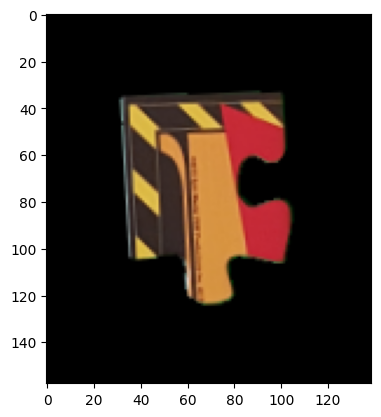

current position: (0,1)
[[0, 0]]


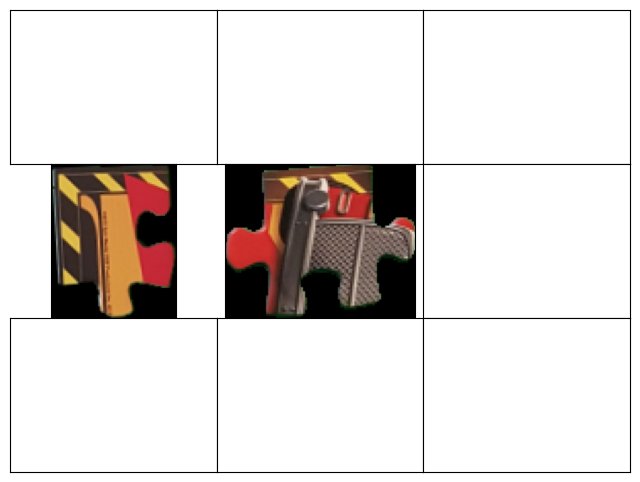

comfirm [y/n]:y
*******************************************************
current position: (0,2)
[[0, 0], [18, 3]]


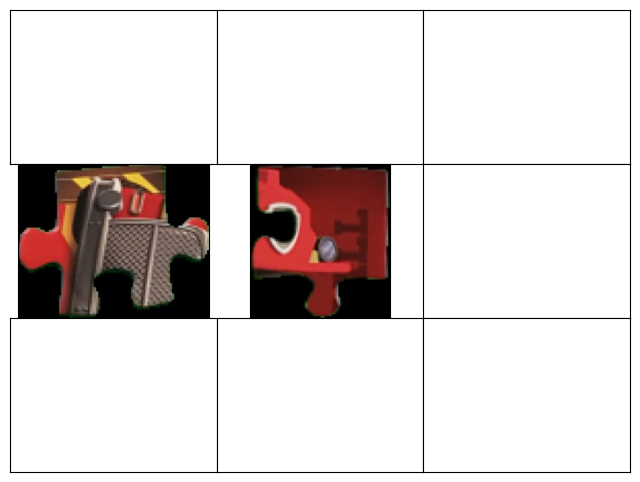

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


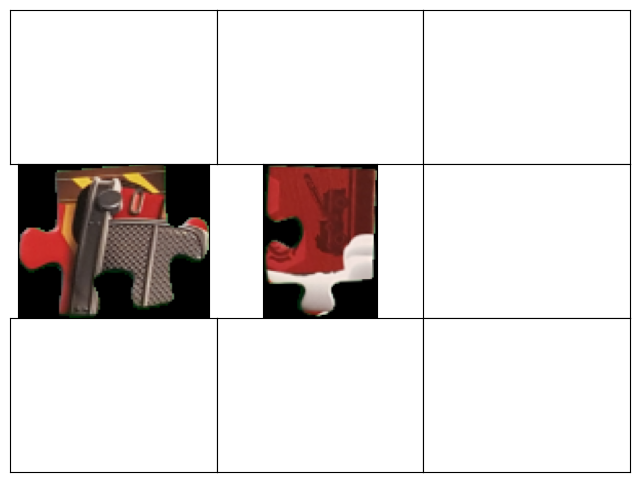

--------------------------------------
piece: 1


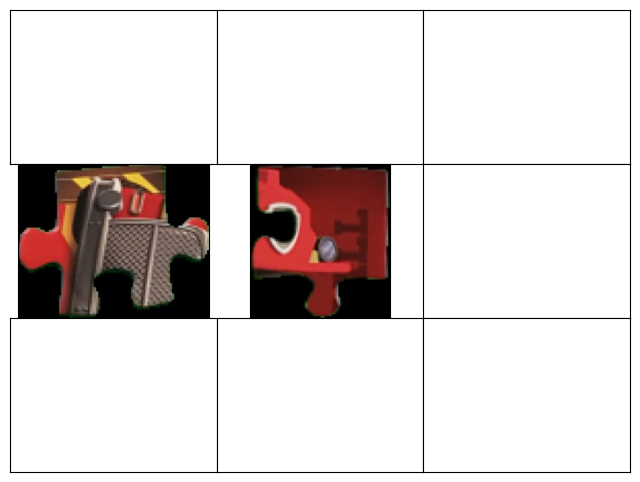

--------------------------------------
piece: 2


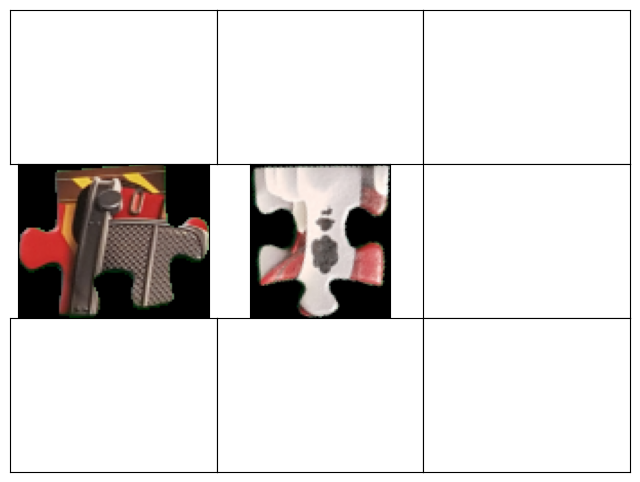

--------------------------------------
piece: 3


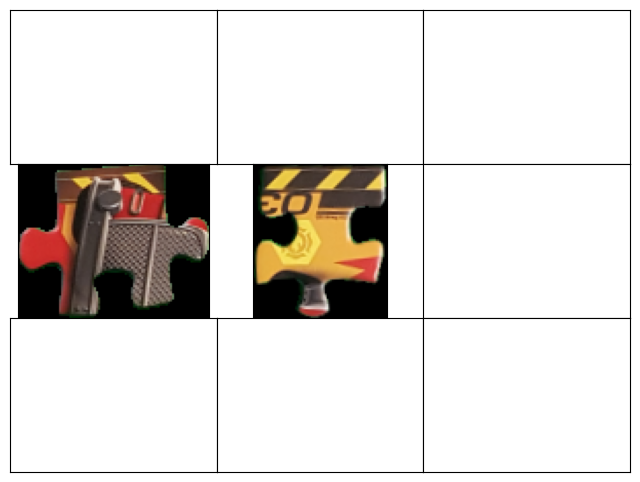

--------------------------------------
piece: 4


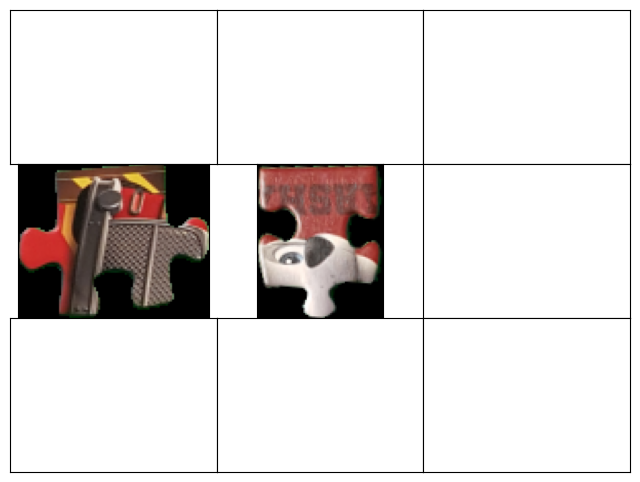

--------------------------------------
piece: 5


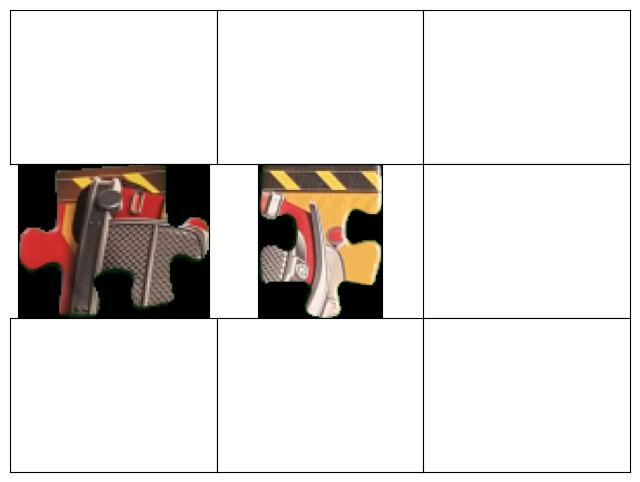

--------------------------------------
piece: 6


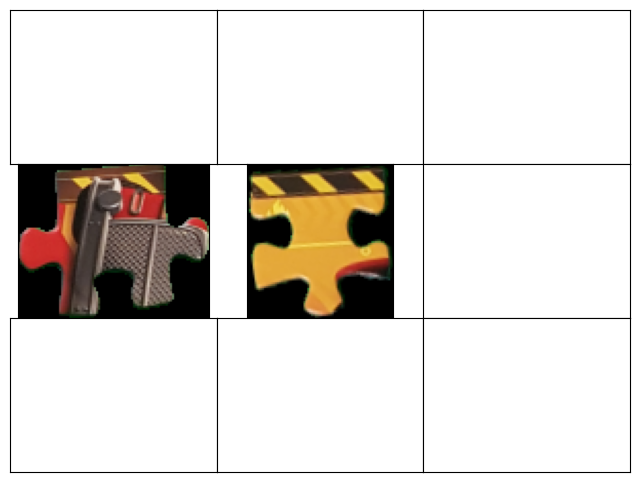

--------------------------------------
selecet piece:5
*******************************************************
current position: (0,3)
[[0, 0], [18, 3], [5, 2]]


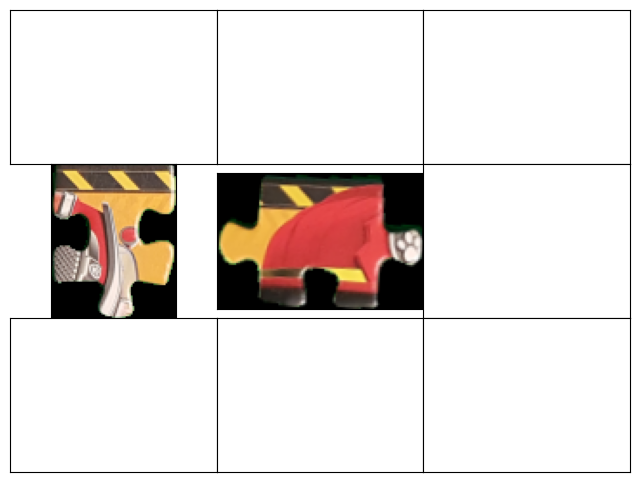

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


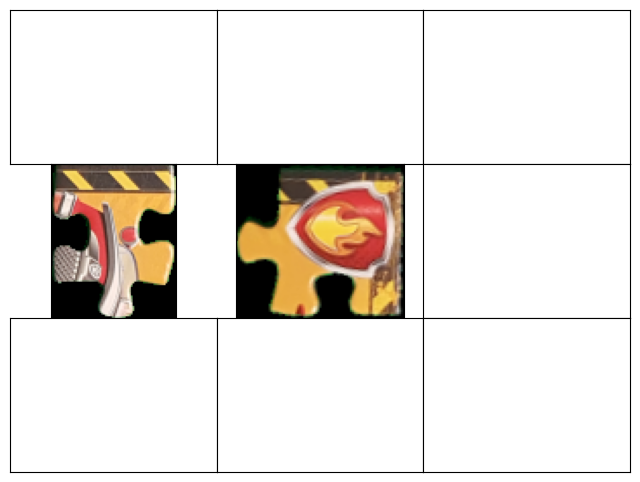

--------------------------------------
piece: 1


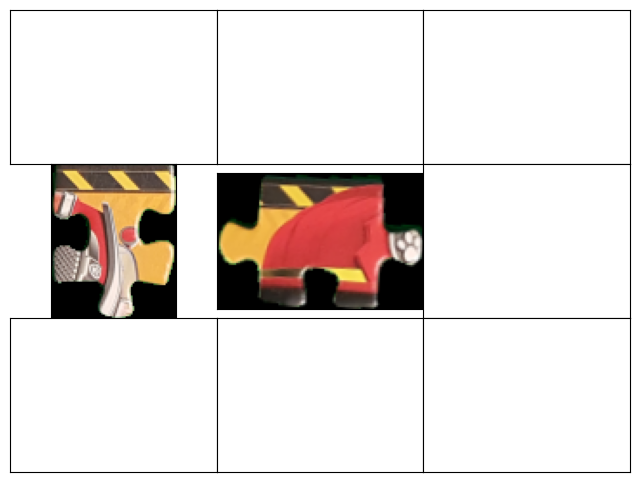

--------------------------------------
piece: 2


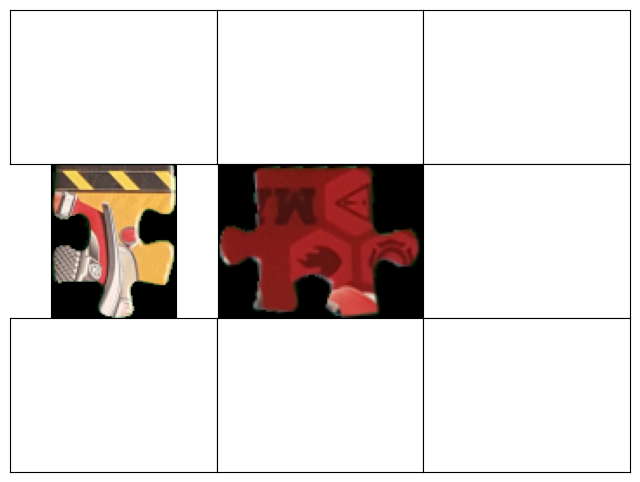

--------------------------------------
piece: 3


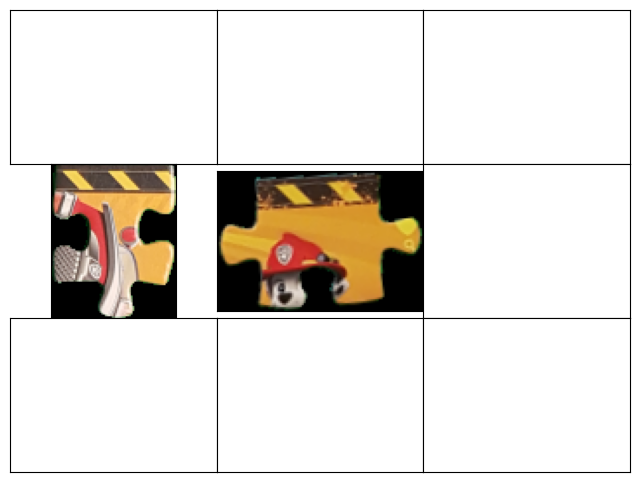

--------------------------------------
piece: 4


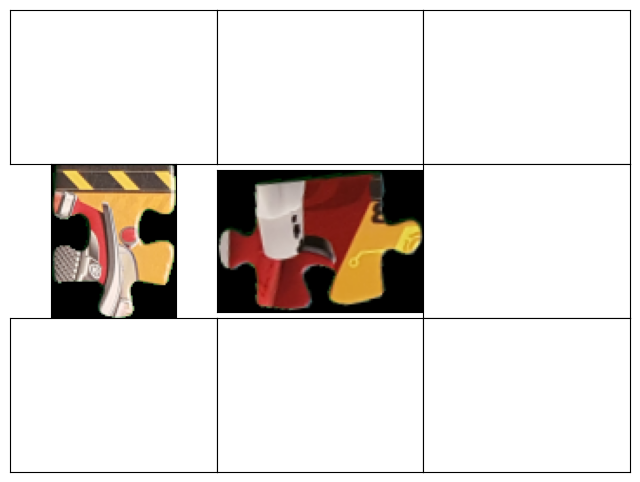

--------------------------------------
selecet piece:0
*******************************************************
current position: (1,3)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, None]
[None, None, None, None]
[None, None, None, None]
[None, None, None, None]


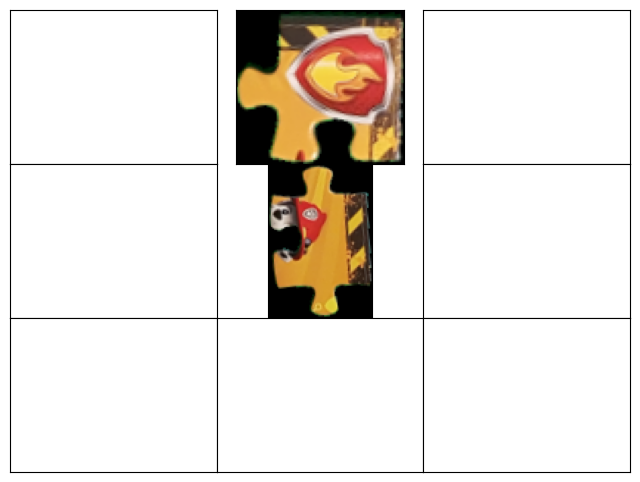

comfirm [y/n]:y
*******************************************************
current position: (2,3)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, None]
[None, None, None, None]
[None, None, None, None]


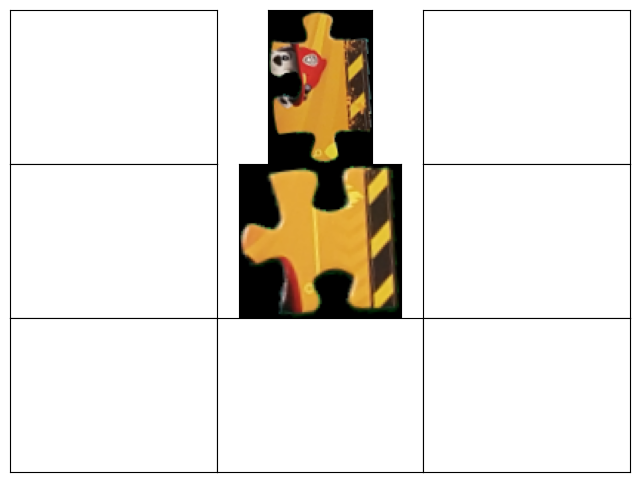

comfirm [y/n]:y
*******************************************************
current position: (3,3)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, [16, 3]]
[None, None, None, None]
[None, None, None, None]


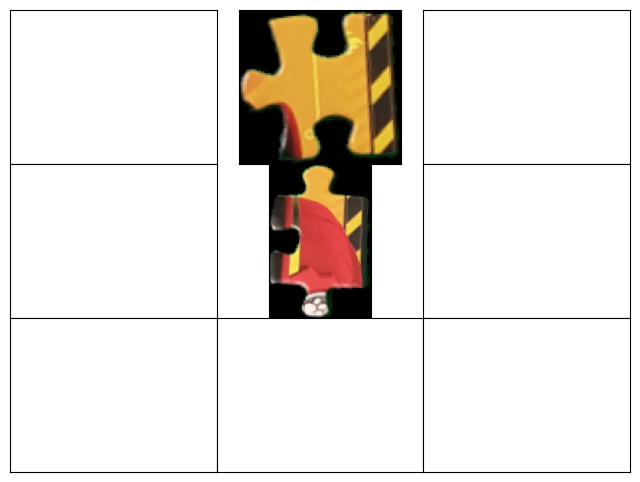

comfirm [y/n]:y
*******************************************************
current position: (4,3)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, [16, 3]]
[None, None, None, [11, 3]]
[None, None, None, None]


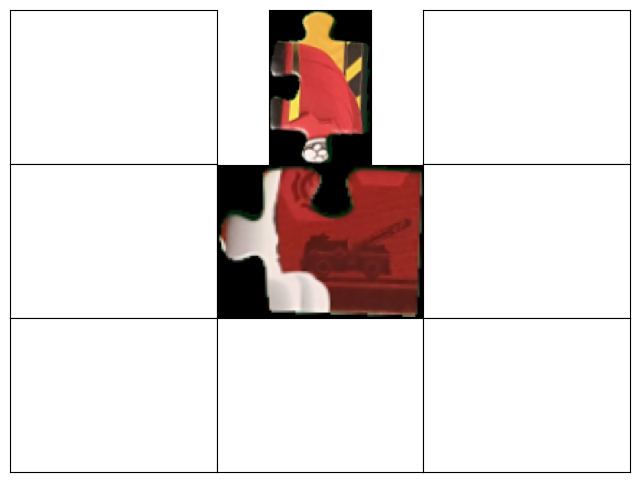

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


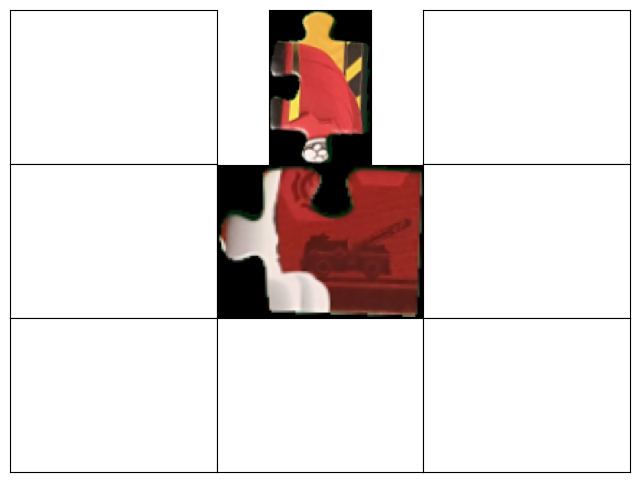

--------------------------------------
piece: 1


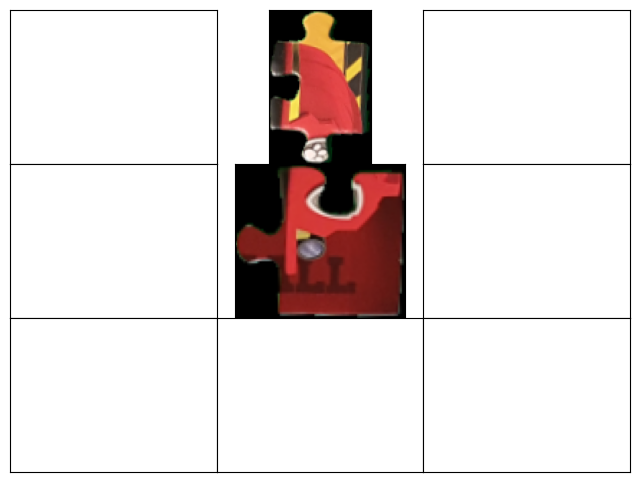

--------------------------------------
selecet piece:1
*******************************************************
current position: (4,2)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, [16, 3]]
[None, None, None, [11, 3]]
[None, None, None, [9, 1]]


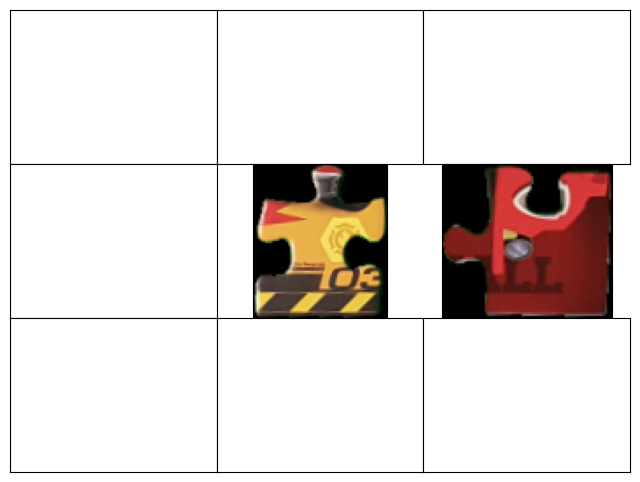

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


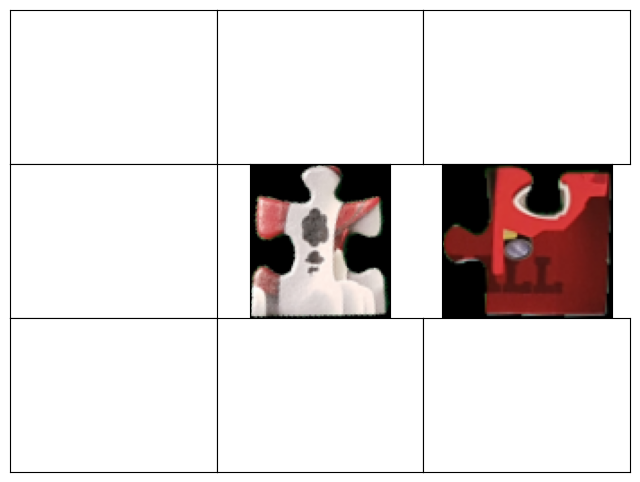

--------------------------------------
piece: 1


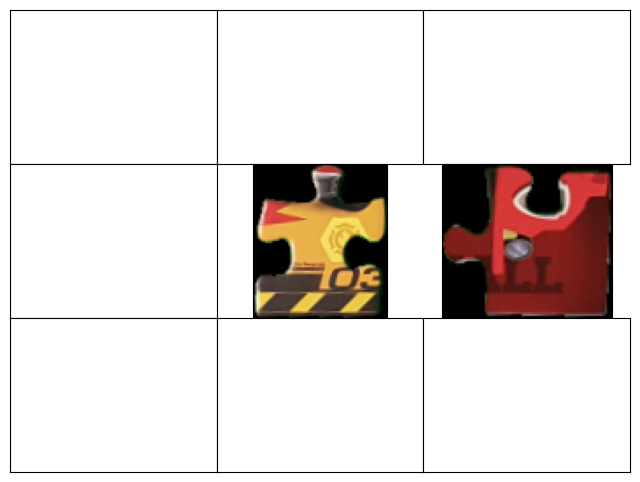

--------------------------------------
piece: 2


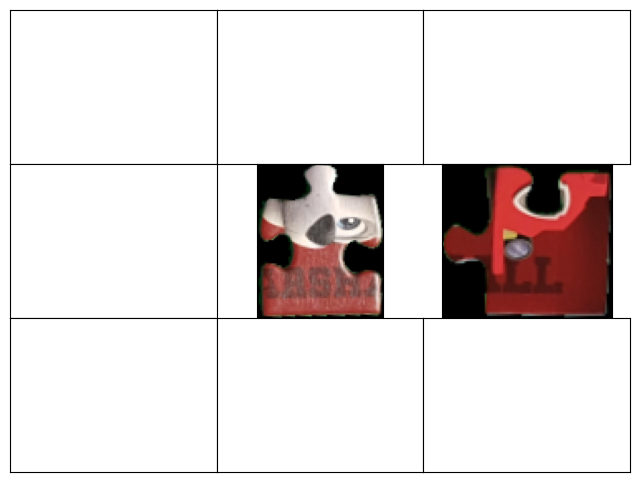

--------------------------------------
selecet piece:2
*******************************************************
current position: (4,1)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, [16, 3]]
[None, None, None, [11, 3]]
[None, None, [4, 1], [9, 1]]


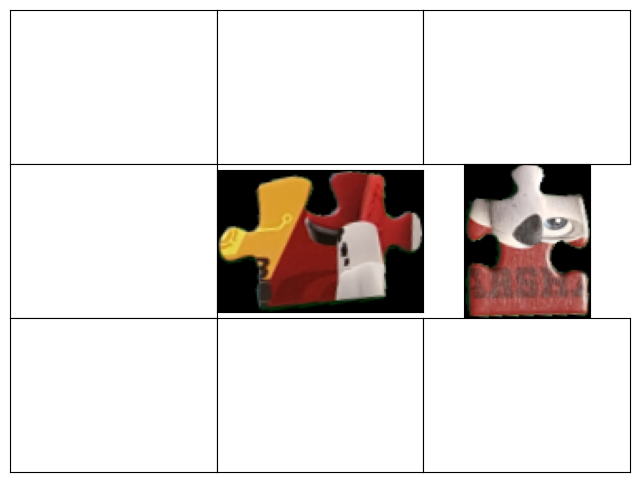

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


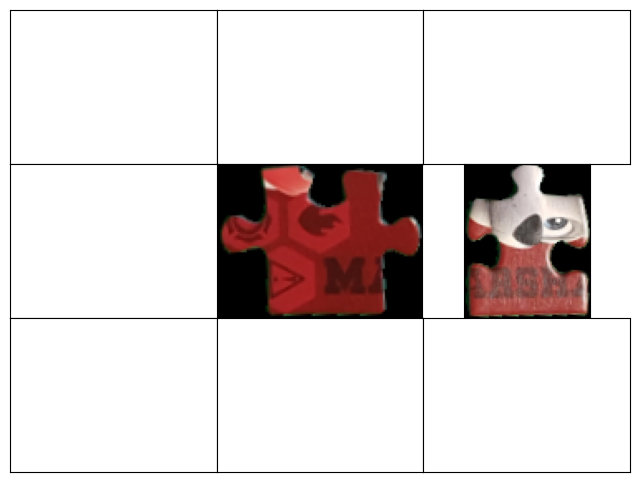

--------------------------------------
piece: 1


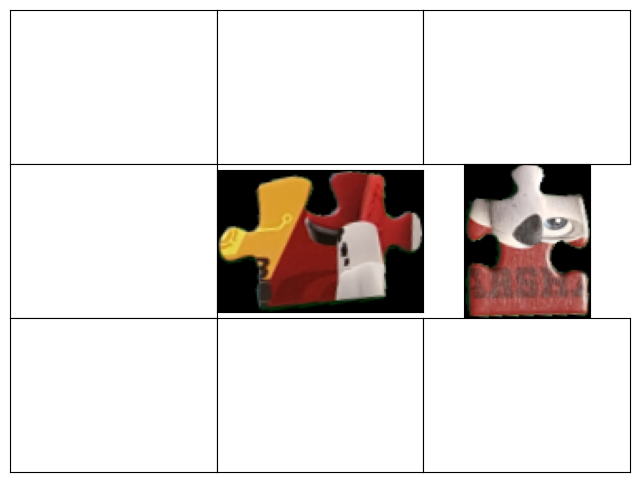

--------------------------------------
selecet piece:0
*******************************************************
current position: (4,0)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, [16, 3]]
[None, None, None, [11, 3]]
[None, [12, 2], [4, 1], [9, 1]]


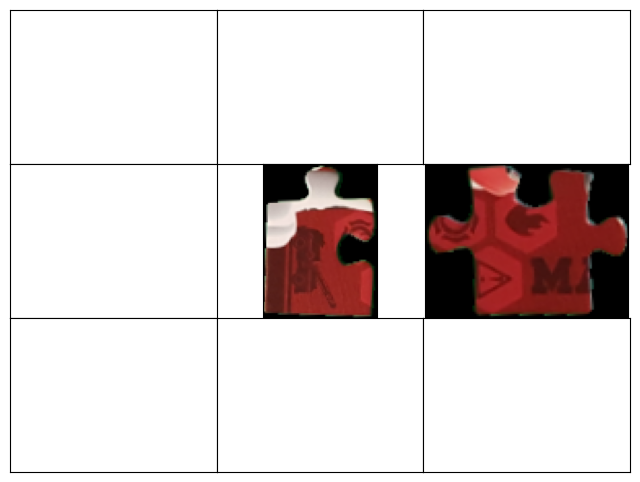

comfirm [y/n]:y
*******************************************************
current position: (3,0)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, [16, 3]]
[None, None, None, [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


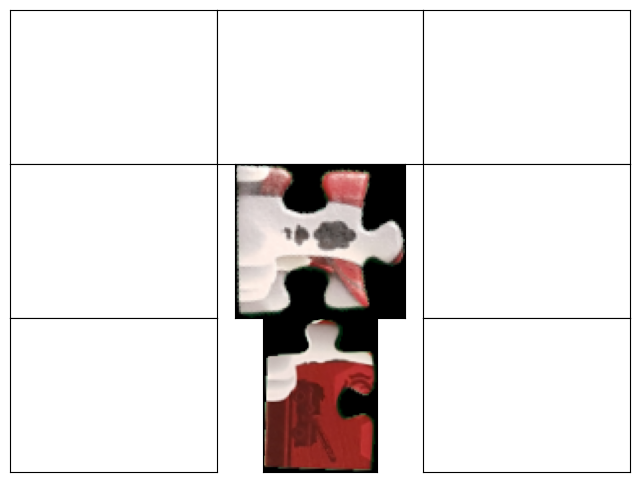

comfirm [y/n]:y
*******************************************************
current position: (2,0)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[None, None, None, [16, 3]]
[[1, 2], None, None, [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


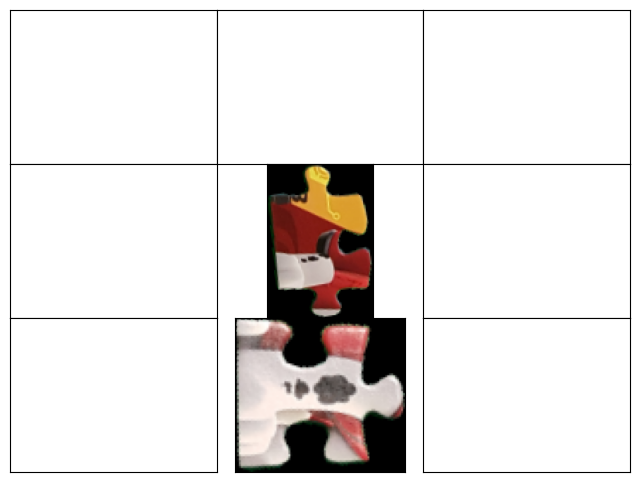

comfirm [y/n]:y
*******************************************************
current position: (1,0)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[None, None, None, [17, 2]]
[[19, 2], None, None, [16, 3]]
[[1, 2], None, None, [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


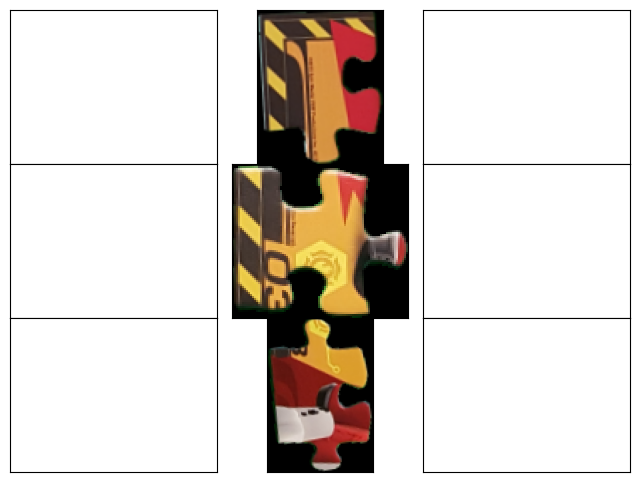

comfirm [y/n]:y
*******************************************************
current position: (1,1)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[[2, 3], None, None, [17, 2]]
[[19, 2], None, None, [16, 3]]
[[1, 2], None, None, [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


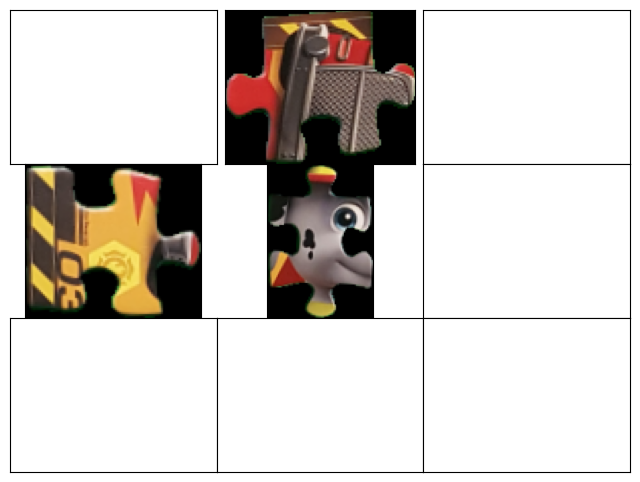

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


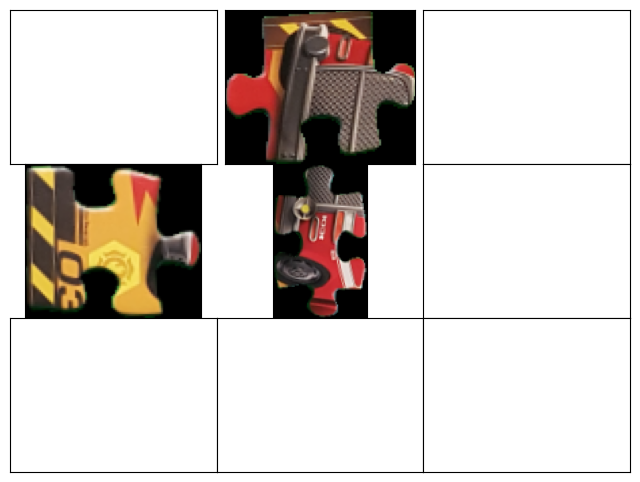

--------------------------------------
piece: 1


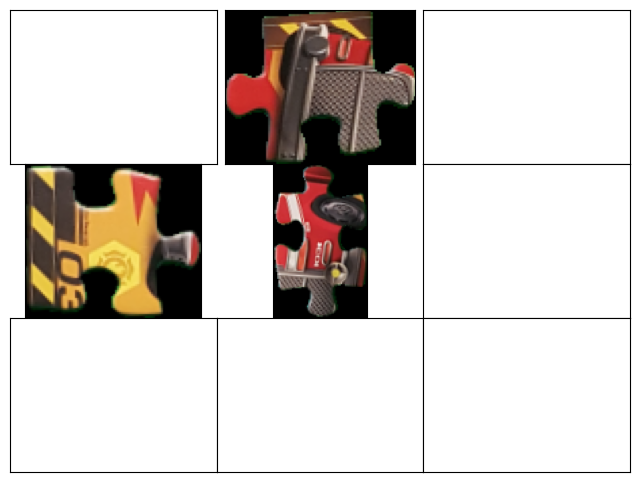

--------------------------------------
piece: 2


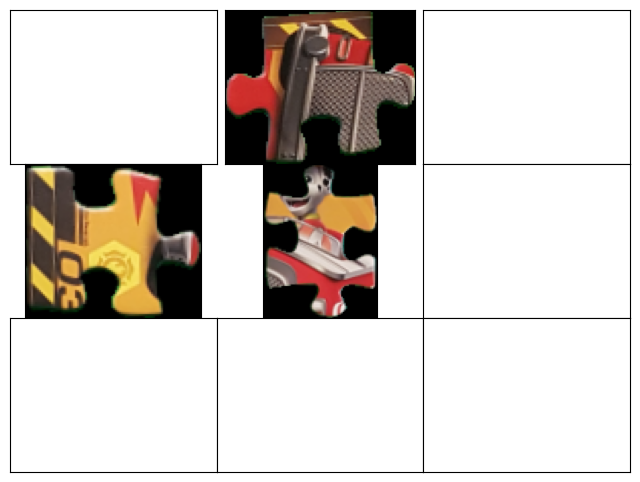

--------------------------------------
piece: 3


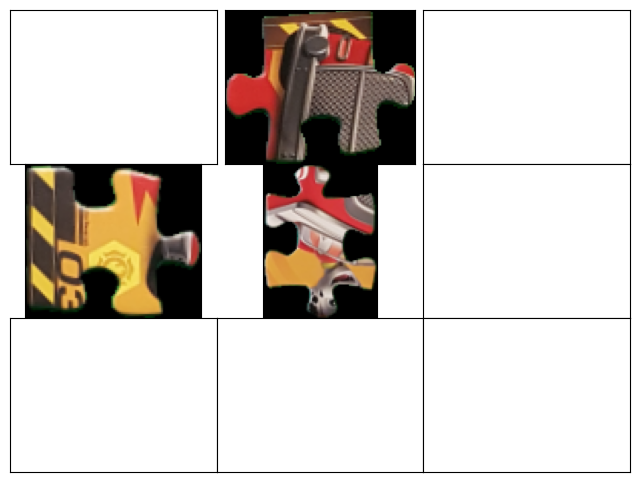

--------------------------------------
piece: 4


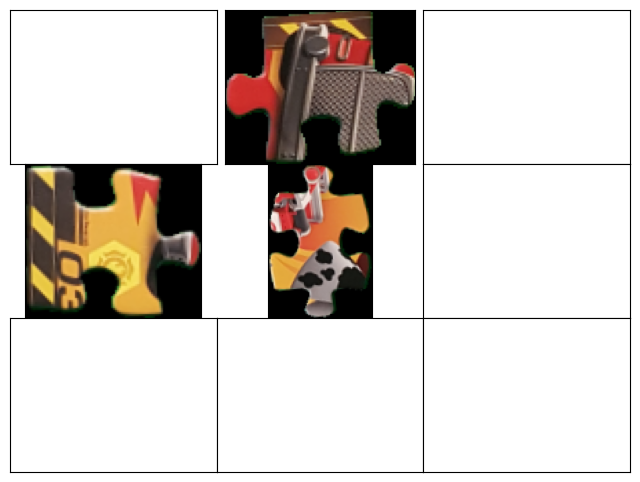

--------------------------------------
piece: 5


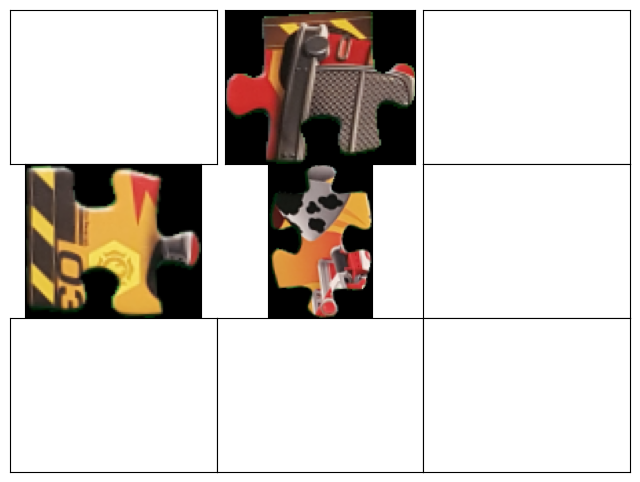

--------------------------------------
piece: 6


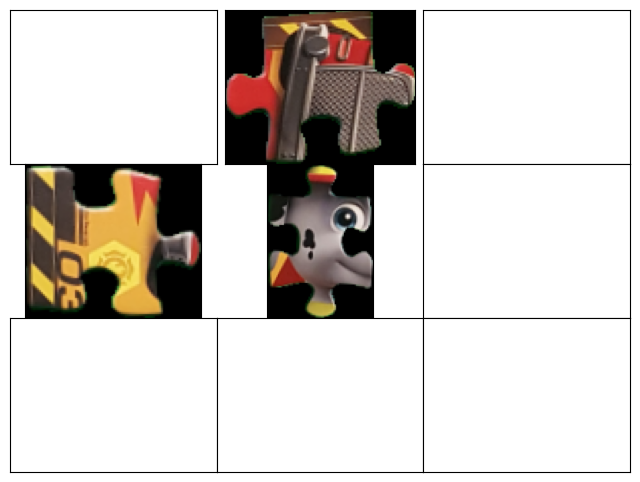

--------------------------------------
piece: 7


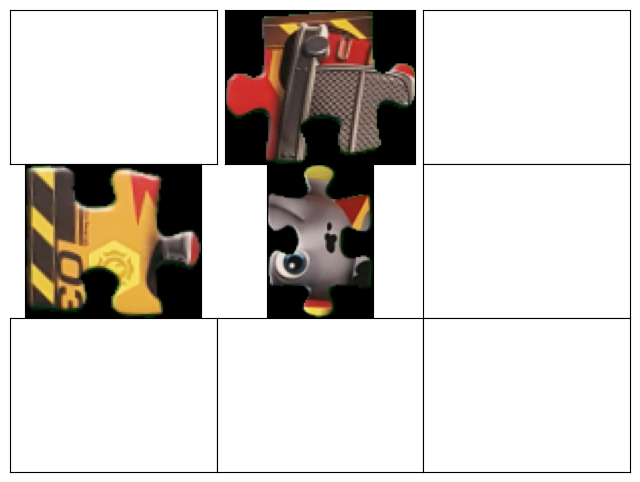

--------------------------------------
piece: 8


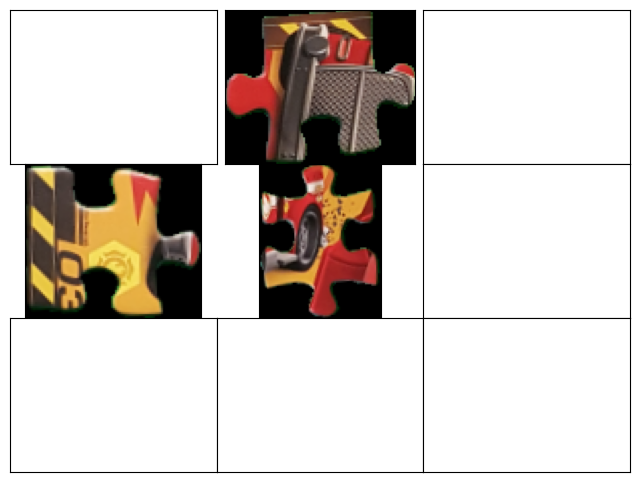

--------------------------------------
piece: 9


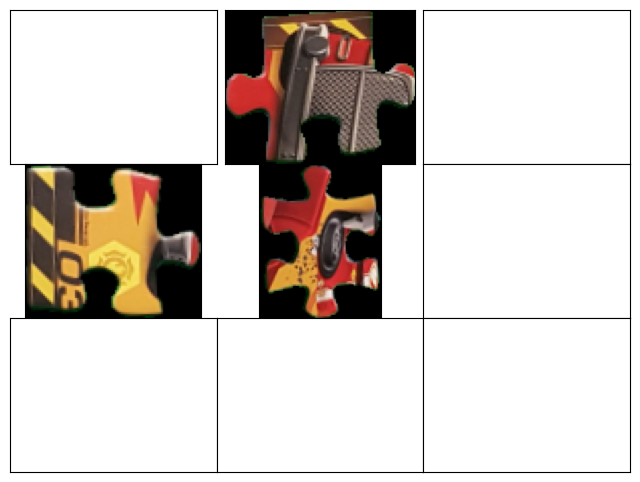

--------------------------------------
piece: 10


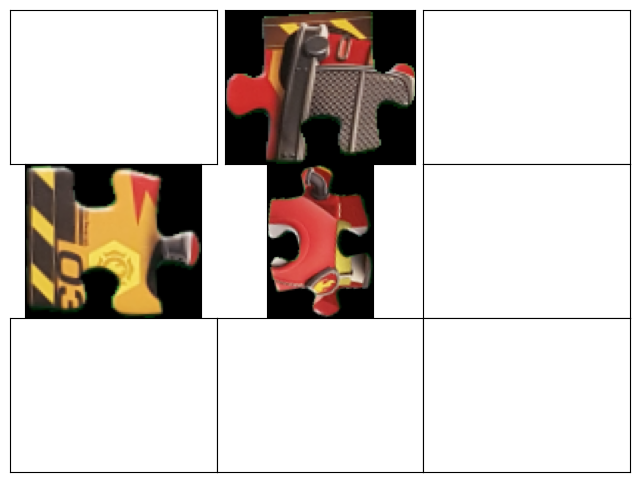

--------------------------------------
piece: 11


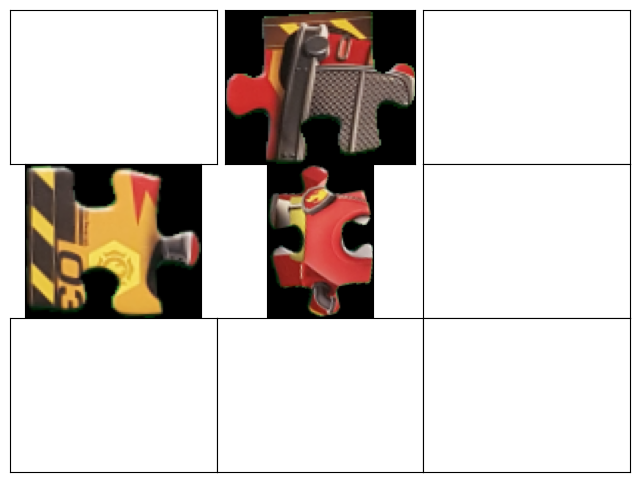

--------------------------------------
selecet piece:0
*******************************************************
current position: (1,2)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[[2, 3], [3, 1], None, [17, 2]]
[[19, 2], None, None, [16, 3]]
[[1, 2], None, None, [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


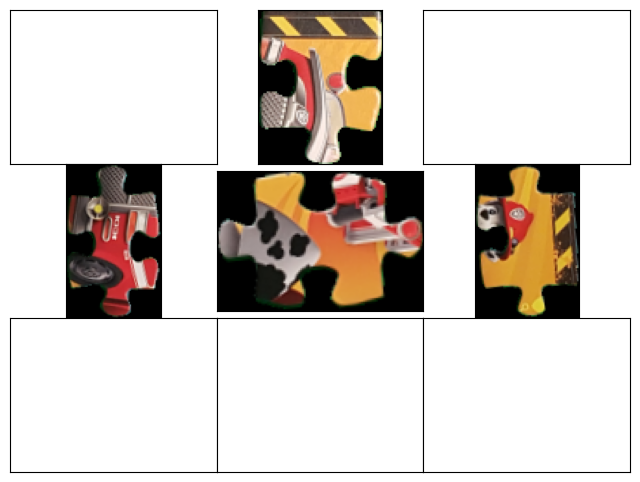

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


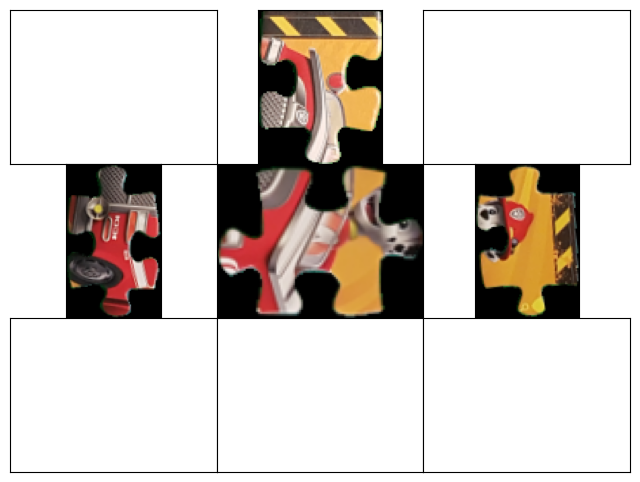

--------------------------------------
piece: 1


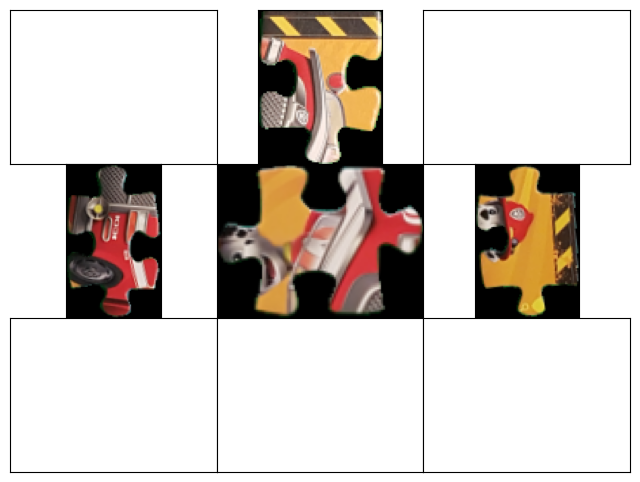

--------------------------------------
piece: 2


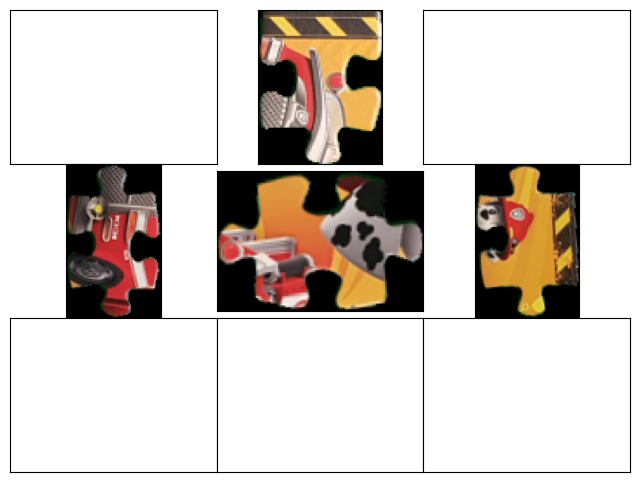

--------------------------------------
piece: 3


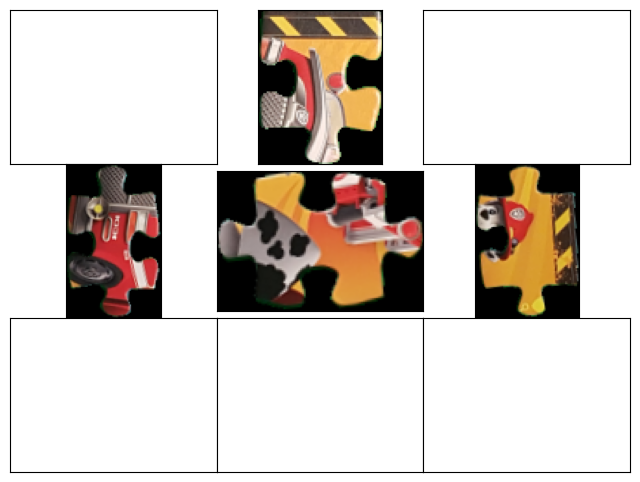

--------------------------------------
piece: 4


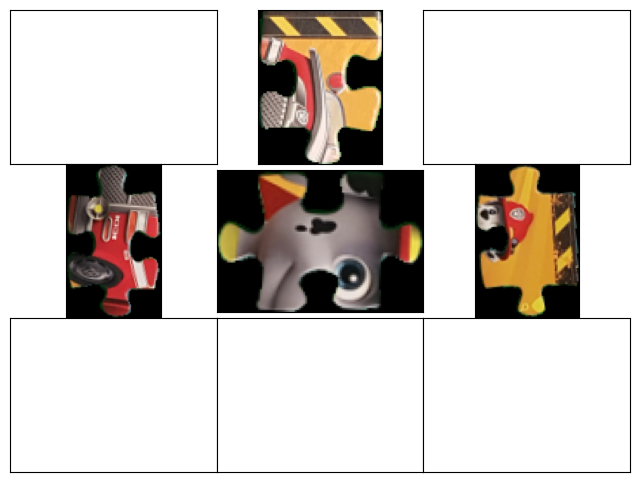

--------------------------------------
piece: 5


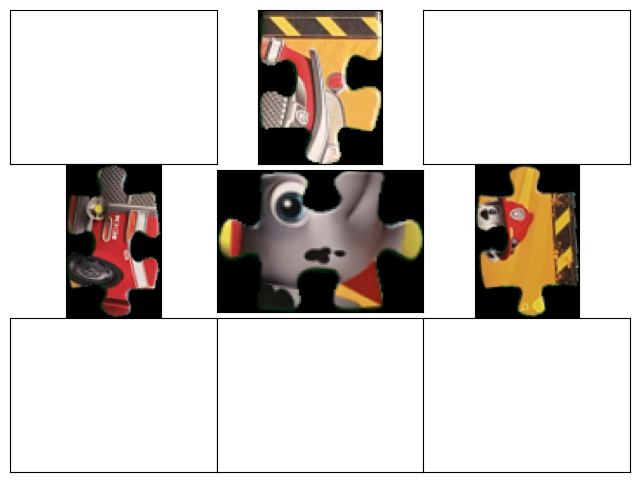

--------------------------------------
piece: 6


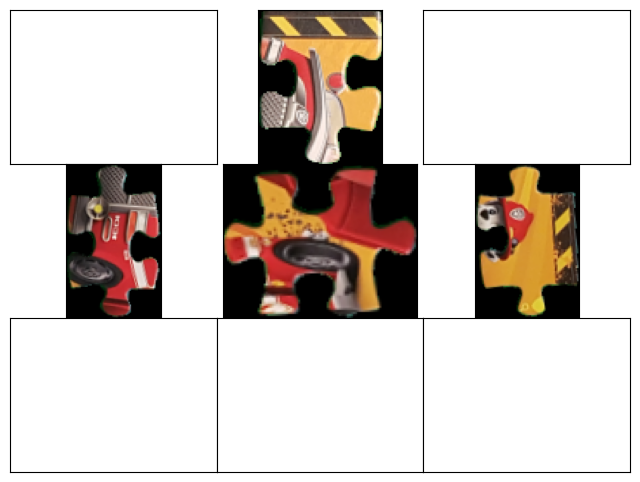

--------------------------------------
piece: 7


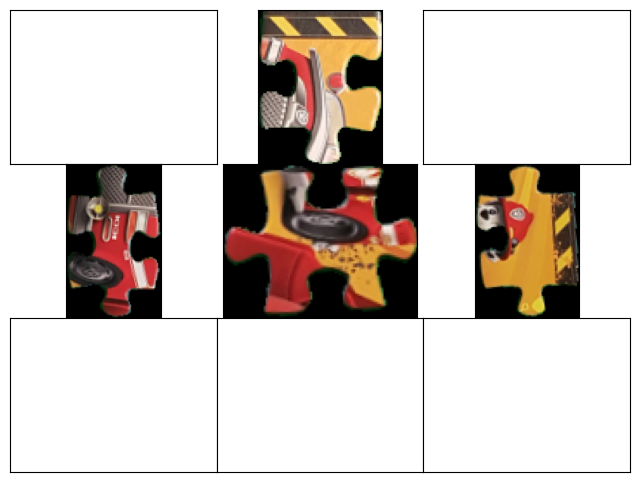

--------------------------------------
piece: 8


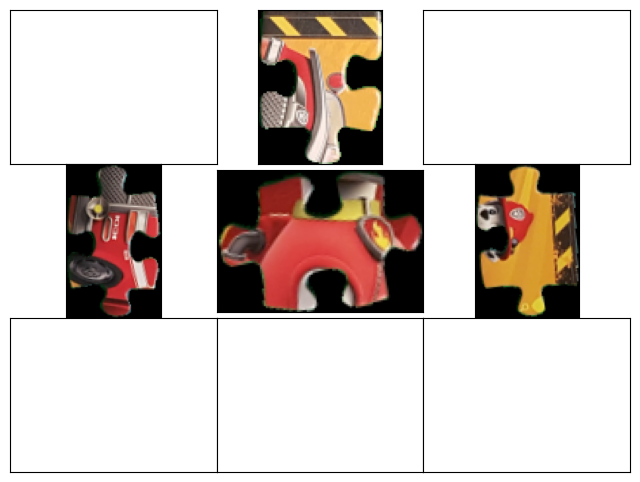

--------------------------------------
piece: 9


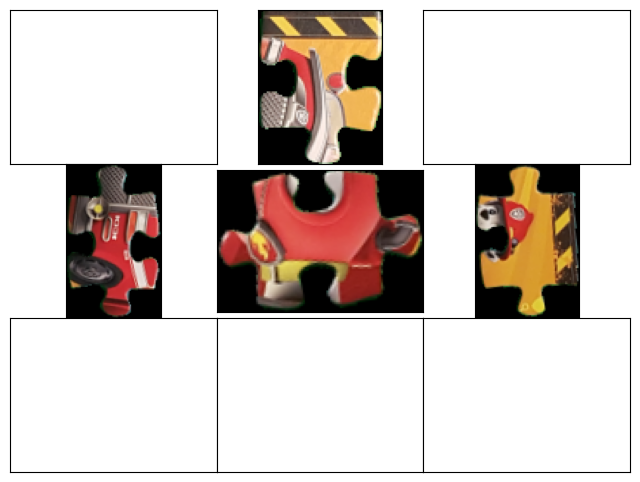

--------------------------------------
selecet piece:0
*******************************************************
current position: (2,2)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[[2, 3], [3, 1], [6, 0], [17, 2]]
[[19, 2], None, None, [16, 3]]
[[1, 2], None, None, [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


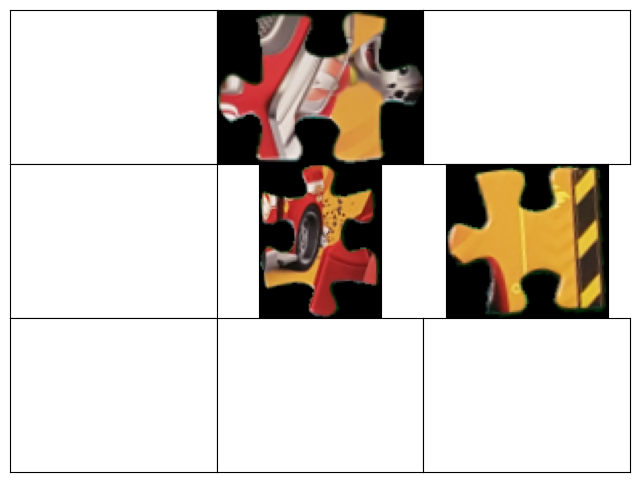

comfirm [y/n]:n
please choose from the candidate pieces
piece: 0


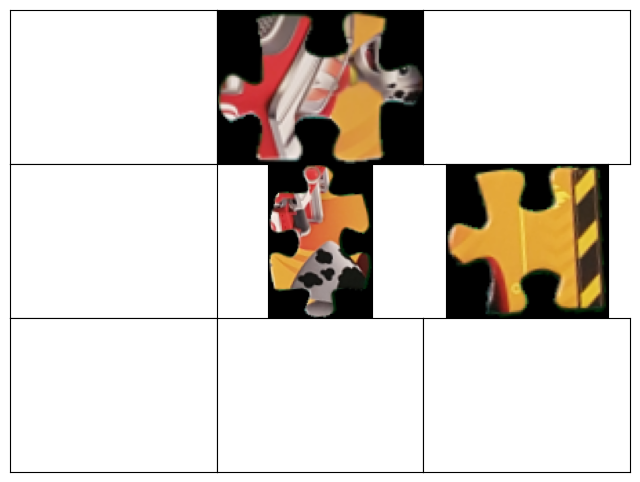

--------------------------------------
piece: 1


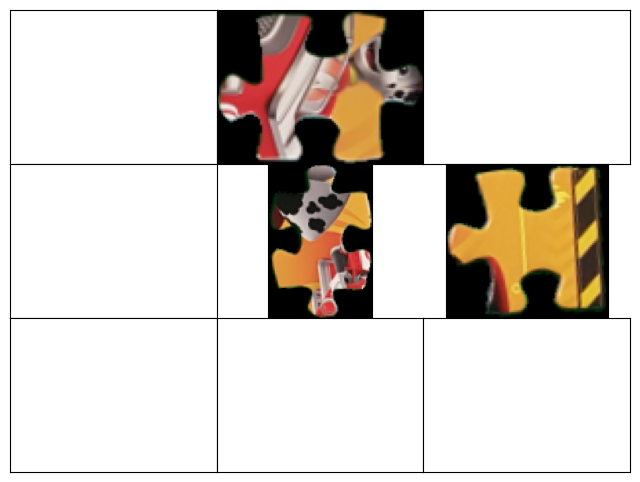

--------------------------------------
piece: 2


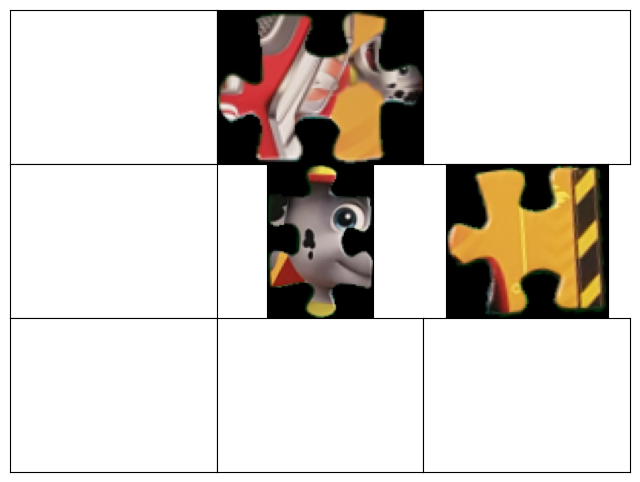

--------------------------------------
piece: 3


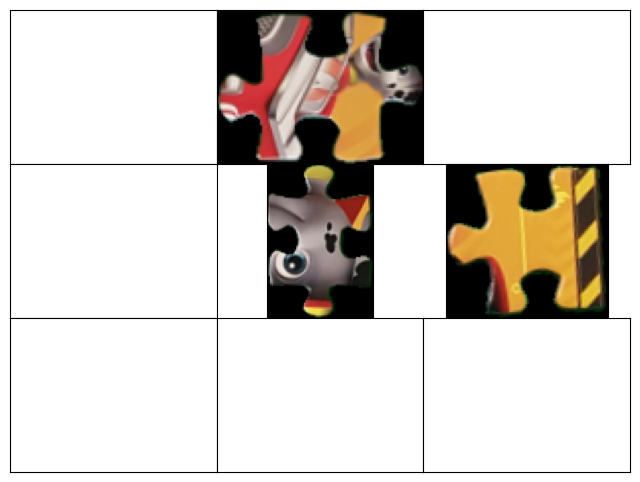

--------------------------------------
piece: 4


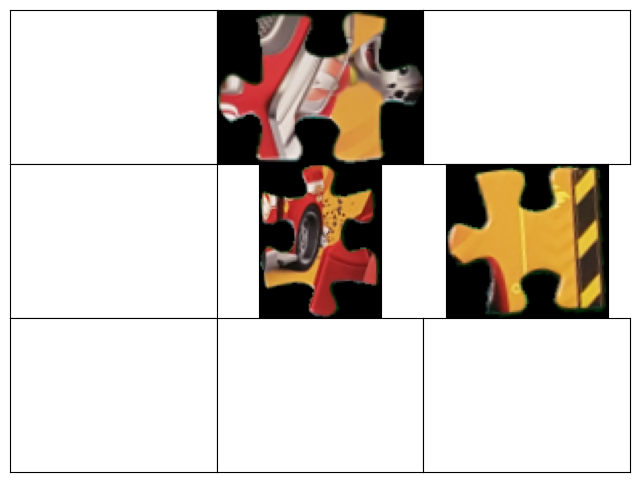

--------------------------------------
piece: 5


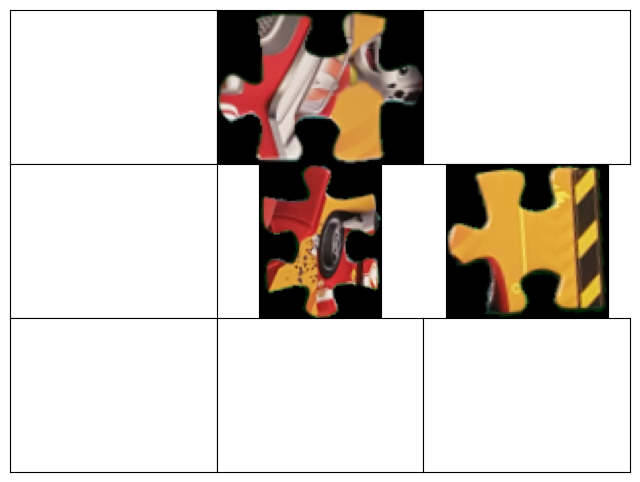

--------------------------------------
piece: 6


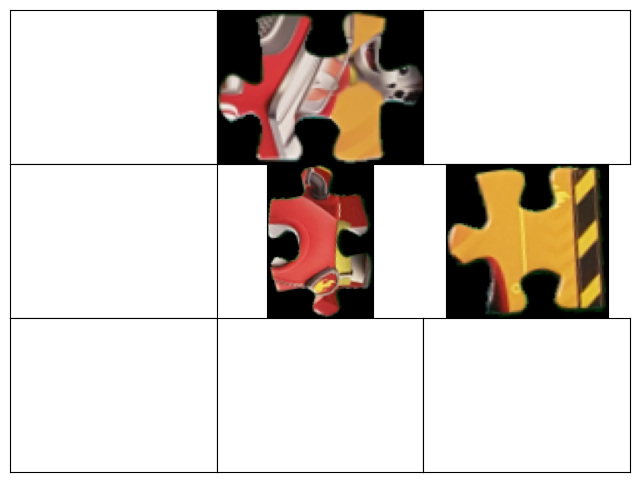

--------------------------------------
piece: 7


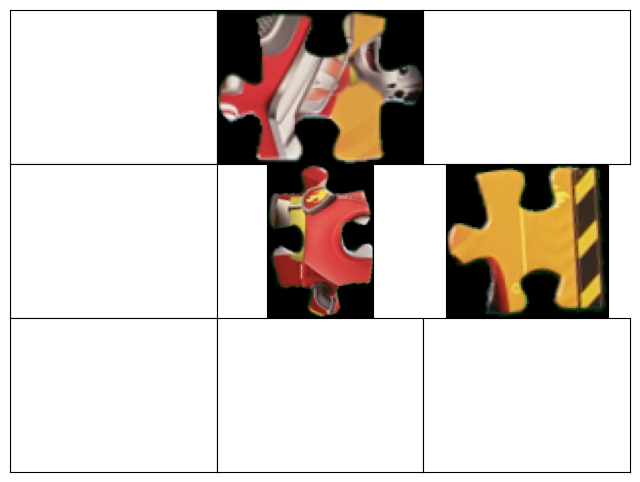

--------------------------------------
selecet piece:0
*******************************************************
current position: (3,2)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[[2, 3], [3, 1], [6, 0], [17, 2]]
[[19, 2], None, [7, 0], [16, 3]]
[[1, 2], None, None, [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


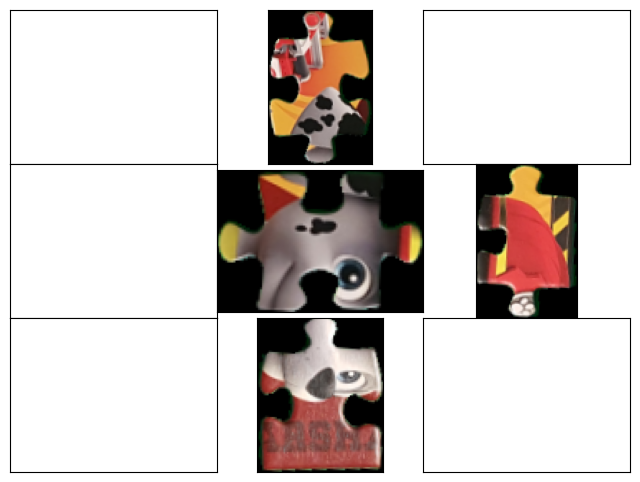

comfirm [y/n]:y
*******************************************************
current position: (3,1)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[[2, 3], [3, 1], [6, 0], [17, 2]]
[[19, 2], None, [7, 0], [16, 3]]
[[1, 2], None, [10, 0], [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


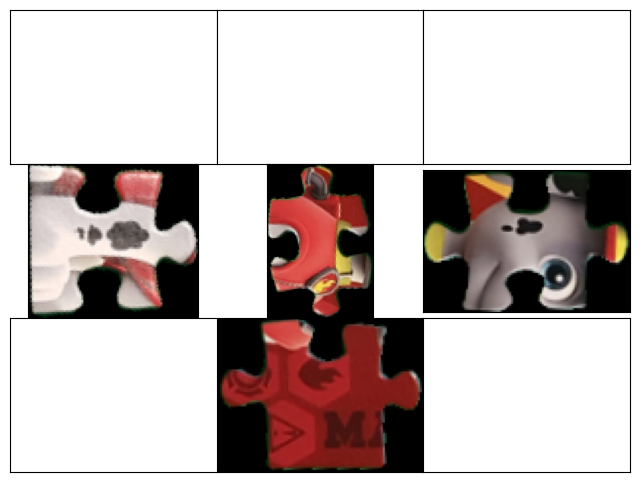

comfirm [y/n]:y
*******************************************************
current position: (2,1)
[[0, 0], [18, 3], [5, 2], [14, 1]]
[[2, 3], [3, 1], [6, 0], [17, 2]]
[[19, 2], None, [7, 0], [16, 3]]
[[1, 2], [15, 0], [10, 0], [11, 3]]
[[8, 0], [12, 2], [4, 1], [9, 1]]


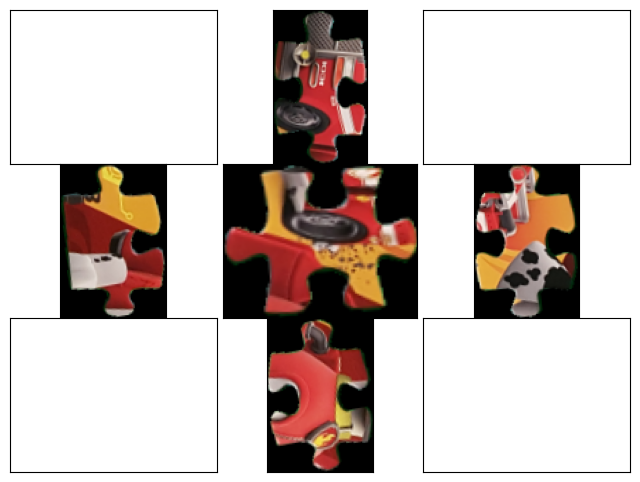

comfirm [y/n]:y
*******************************************************
...done...


In [ ]:
joiner = Joiner(jigsaw_pieces)
while joiner.move_to_next_pos():
  print(f'current position: ({joiner.row},{joiner.col})')
  for row in joiner.board: print(row)
  
  pieces = joiner.get_all_candidates()
  if len(pieces) == 0: print('failed');break

  target = 0
  best_piece = best_match(pieces)
  show_candidate(joiner, best_piece)
  if input('comfirm [y/n]:') == 'y':
    target = best_piece
  else:
    print('please choose from the candidate pieces')
    for i, p in enumerate(pieces):
      print('piece:',i)
      show_candidate(joiner, p)
      print('--------------------------------------')
    target = pieces[int(input('selecet piece:'))]

  print('*******************************************************')
  joiner.place_jigsaw(target)
print('...done...')

In [ ]:
joiner.board

[[[0, 0], [18, 3], [5, 2], [14, 1]],
 [[2, 3], [3, 1], [6, 0], [17, 2]],
 [[19, 2], [13, 3], [7, 0], [16, 3]],
 [[1, 2], [15, 0], [10, 0], [11, 3]],
 [[8, 0], [12, 2], [4, 1], [9, 1]]]

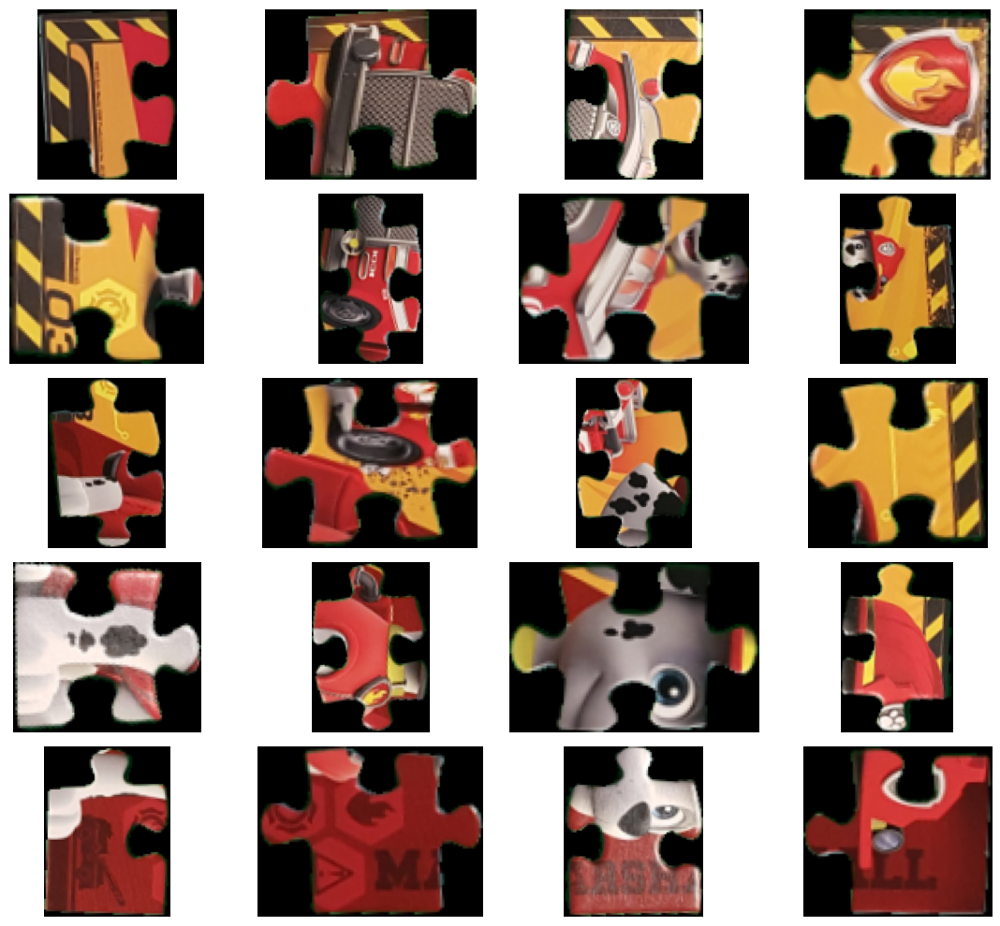

In [ ]:
show_result(joiner)